In [42]:
# Import all datasets for sit to stand

import pandas as pd
from data_collector import get_sit_to_stand_paths, get_sit_to_stand_challenge_paths, get_water_task_paths, get_water_task_challenge_paths, get_step_count_paths, get_step_count_challenge_paths
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

task = 'step_count'
if task == 'sit2stand':
    paths_standard = get_sit_to_stand_paths()
    paths_challenge = get_sit_to_stand_challenge_paths()
elif task == 'water':
    paths_standard = get_water_task_paths()
    paths_challenge = get_water_task_challenge_paths()
elif task == 'step_count':
    paths_standard = get_step_count_paths()
    paths_challenge = get_step_count_challenge_paths()

# Sort the paths by path.split('/')[-2]
paths_standard.sort(key=lambda x: x.split('/')[-2])
paths_challenge.sort(key=lambda x: x.split('/')[-2])

print("Standard paths:")

for path in paths_standard:
    print(path.split('/')[-2])

print("Challenge paths:")
for path in paths_challenge:
    print(path.split('/')[-2])


dfs_stand = [pd.read_csv(path) for path in paths_standard]
dfs_stand_challenge = [pd.read_csv(path) for path in paths_challenge]


Data directory to look in: /Users/ashish/Desktop/DS4W/sensorhub-analysis/data
Sub directories for each Device ID found: ['f3eba7e5-dbda-4f4c-9fa8-8e8308b334f6', '5f680dfb-2510-4790-8f10-cb8724e7004c', '3c2d2423-8ac8-4a8c-95e2-aba5cc14abf8']
Data directory to look in: /Users/ashish/Desktop/DS4W/sensorhub-analysis/data
Sub directories for each Device ID found: ['f3eba7e5-dbda-4f4c-9fa8-8e8308b334f6', '5f680dfb-2510-4790-8f10-cb8724e7004c', '3c2d2423-8ac8-4a8c-95e2-aba5cc14abf8']
Standard paths:
2025-05-08T12_25_14Z-step_count
2025-05-08T12_29_13Z-step_count
2025-05-08T12_51_36Z-step_count
2025-05-12T07_02_15Z-step_count
2025-05-12T07_04_20Z-step_count
Challenge paths:
2025-05-08T12_26_42Z-step_count_challenge
2025-05-08T12_30_55Z-step_count_challenge
2025-05-08T12_52_51Z-step_count_challenge
2025-05-12T07_03_14Z-step_count_challenge
2025-05-12T07_05_26Z-step_count_challenge


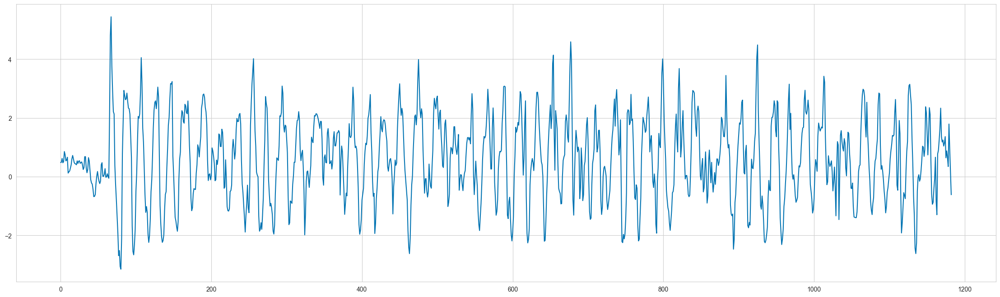

In [43]:
plt.figure(figsize=(28, 8))
(dfs_stand[0]['acceleration_m/s²_z'] - 9).plot()
plt.show()


In [44]:
def preprocess_data(df):
    from scipy import signal, integrate

    df['time_s'] = (df['timestamp_ms'] - df['timestamp_ms'].min()) / 1000

    df.rename(columns={'acceleration_m/s²_x': 'freeAcceleration_m/s²_x', 'acceleration_m/s²_y': 'freeAcceleration_m/s²_y', 'acceleration_m/s²_z': 'freeAcceleration_m/s²_z'}, inplace=True)
    
    # remove rows after 30 seconds
    df = df[df['time_s'] <= 30]

    # Remove the influence of gravity from the z axis
    df['freeAcceleration_m/s²_z'] = df['freeAcceleration_m/s²_z'] - 9.81
    
    
    
    # Calculate magnitude of acceleration 
    df['acceleration_magnitude'] = np.sqrt(
        df['freeAcceleration_m/s²_x']**2 + 
        df['freeAcceleration_m/s²_y']**2 + 
        df['freeAcceleration_m/s²_z']**2
    )

    # Apply detrending to each axis
    df['acc_detrended_x'] = signal.detrend(df['freeAcceleration_m/s²_x'], type='linear')
    df['acc_detrended_y'] = signal.detrend(df['freeAcceleration_m/s²_y'], type='linear')
    df['acc_detrended_z'] = signal.detrend(df['freeAcceleration_m/s²_z'], type='linear')

    # Calculate detrended magnitude of acceleration
    df['acceleration_magnitude_detrended'] = np.sqrt(df['acc_detrended_x']**2 + df['acc_detrended_y']**2 + df['acc_detrended_z']**2)

    # Calculate velocity with detrending
    df['velocity_z'] = integrate.cumulative_trapezoid(df['acc_detrended_z'], df['time_s'], initial=0)
    df['velocity_x'] = integrate.cumulative_trapezoid(df['acc_detrended_x'], df['time_s'], initial=0)
    df['velocity_y'] = integrate.cumulative_trapezoid(df['acc_detrended_y'], df['time_s'], initial=0)

    # Calculate magnitude of velocity
    df['velocity_magnitude'] = np.sqrt(df['velocity_x']**2 + df['velocity_y']**2 + df['velocity_z']**2)

    # Calculate position with detrending
    df['position_z'] = integrate.cumulative_trapezoid(df['velocity_z'], df['time_s'], initial=0)
    df['position_x'] = integrate.cumulative_trapezoid(df['velocity_x'], df['time_s'], initial=0)
    df['position_y'] = integrate.cumulative_trapezoid(df['velocity_y'], df['time_s'], initial=0)

    return df

dfs_stand = [preprocess_data(df) for df in dfs_stand]
dfs_stand_challenge = [preprocess_data(df) for df in dfs_stand_challenge]
    
    

    



/var/folders/zp/3681gr8x5mg9vt0z3xbtlzx00000gn/T/ipykernel_33421/1017378032.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['freeAcceleration_m/s²_z'] = df['freeAcceleration_m/s²_z'] - 9.81
/var/folders/zp/3681gr8x5mg9vt0z3xbtlzx00000gn/T/ipykernel_33421/1017378032.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['acceleration_magnitude'] = np.sqrt(
/var/folders/zp/3681gr8x5mg9vt0z3xbtlzx00000gn/T/ipykernel_33421/1017378032.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy

In [45]:
def plot_column(df, column_names=[], title=None):
    import matplotlib.pyplot as plt
    import seaborn as sns
    # colors = sns.color_palette("prism", len(column_names))

#     colorblind_safe_colors = [
#     # "#000000",  # black
#     "#E69F00",  # orange
#     "#56B4E9",  # sky blue
#     # "#009E73",  # bluish green
#     # "#F0E442",  # yellow
#     # "#0072B2",  # blue
    
#     "#D55E00",  # vermillion
#     "#CC79A7",  # reddish purple
# ]

    if title is None:
        title = ' | '.join(column_names)


    # plot the column_name vs time_s
    plt.figure(figsize=(16, 8))
    
    for i, column_name in enumerate(column_names):
        if column_name == 'acceleration_magnitude':
            plt.plot(df['time_s'], df[column_name], label=column_name, color='black')
        else:
            plt.plot(df['time_s'], df[column_name], label=column_name, )
        plt.xlabel('Time (s)')
        plt.ylabel(column_name)
        plt.legend()
    plt.title(title)

In [46]:
dfs_stand[0]

,timestamp_ms,freeAcceleration_m/s²_x,freeAcceleration_m/s²_y,freeAcceleration_m/s²_z,time_s,acceleration_magnitude,acc_detrended_x,acc_detrended_y,acc_detrended_z,acceleration_magnitude_detrended,velocity_z,velocity_x,velocity_y,velocity_magnitude,position_z,position_x,position_y
0,1746707114626,-1.446162,2.251646,-0.326048,0.000,2.695849,-0.950396,0.095819,-0.107580,0.961253,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1746707114658,-1.409074,2.175973,-0.318869,0.032,2.611901,-0.913737,0.020210,-0.100467,0.919466,-0.003329,-0.029826,0.001856,0.030069,-0.000053,-0.000477,0.000030
2,1746707114707,-1.507179,2.025823,-0.186367,0.081,2.531853,-1.012273,-0.129877,0.031970,1.021071,-0.005007,-0.077013,-0.000830,0.077180,-0.000257,-0.003095,0.000055
3,1746707114722,-1.503590,2.021038,-0.336217,0.096,2.541342,-1.009113,-0.134599,-0.117945,1.024860,-0.005652,-0.092174,-0.002814,0.092390,-0.000337,-0.004364,0.000028
4,1746707114754,-1.628914,2.047957,-0.294343,0.128,2.633273,-1.134867,-0.107616,-0.076136,1.142498,-0.008757,-0.126477,-0.006689,0.126957,-0.000568,-0.007862,-0.000125
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1105,1746707144514,-0.410668,3.405884,0.571560,29.888,3.477841,-0.390012,1.320273,0.717971,1.552647,-0.122328,0.259018,-0.150454,0.323560,-0.796191,3.508597,0.564708
1106,1746707144546,-1.106680,3.343671,0.616426,29.920,3.575592,-1.086454,1.258123,0.762772,1.828956,-0.098636,0.235394,-0.109200,0.277605,-0.799726,3.516507,0.560553
1107,1746707144562,-1.471885,3.140879,1.340852,29.936,3.718797,-1.452089,1.055395,1.487133,2.331091,-0.080637,0.215086,-0.090692,0.246960,-0.801160,3.520111,0.558954
1108,1746707144594,-1.470090,2.617748,1.820015,29.968,3.510872,-1.450724,0.532328,1.966231,2.500807,-0.025383,0.168641,-0.065288,0.182611,-0.802857,3.526251,0.556458


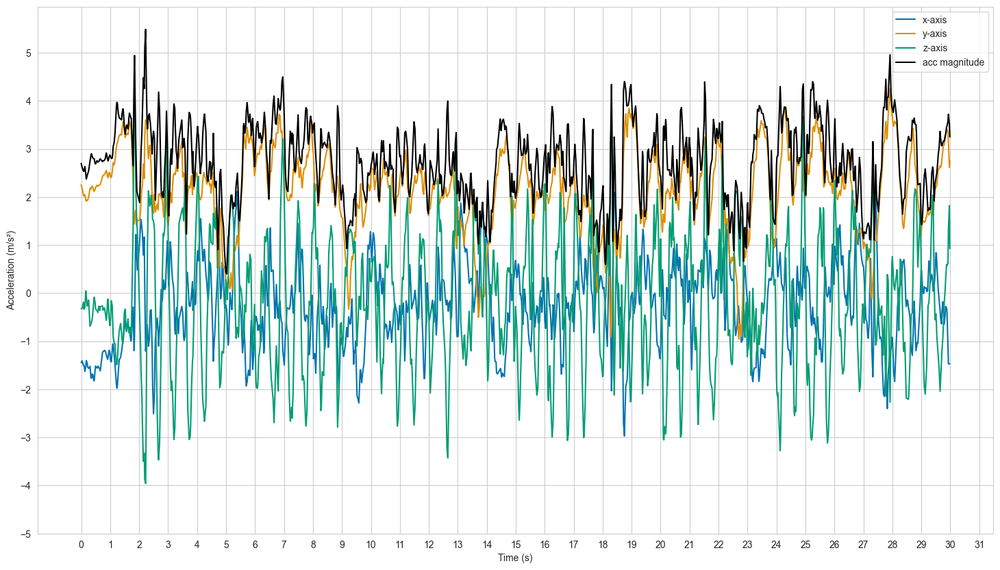

In [73]:
df = dfs_stand[0]

sns.set_style('whitegrid')
sns.set_palette('colorblind')

# plot acceleration along x, y and z axis
plt.figure(figsize=(18, 10))
sns.lineplot(data=df, x='time_s', y='freeAcceleration_m/s²_x', label='x-axis')
sns.lineplot(data=df, x='time_s', y='freeAcceleration_m/s²_y', label='y-axis')
sns.lineplot(data=df, x='time_s', y='freeAcceleration_m/s²_z', label='z-axis')
sns.lineplot(data=df, x='time_s', y='acceleration_magnitude', label='acc magnitude', color='black')

plt.xticks(np.arange(0.0, 31.5, 1))
plt.yticks(np.arange(-5.0, 6, 1))

# # draw a horizontal line at y=0
# plt.axhline(y=0, color='black', linewidth=1)


plt.xlabel('Time (s)')
plt.ylabel('Acceleration (m/s²)')

# plt.title('Acceleration along x, y and z axis for Standard Sit to Stand task')
# plt.tight_layout()
plt.legend()


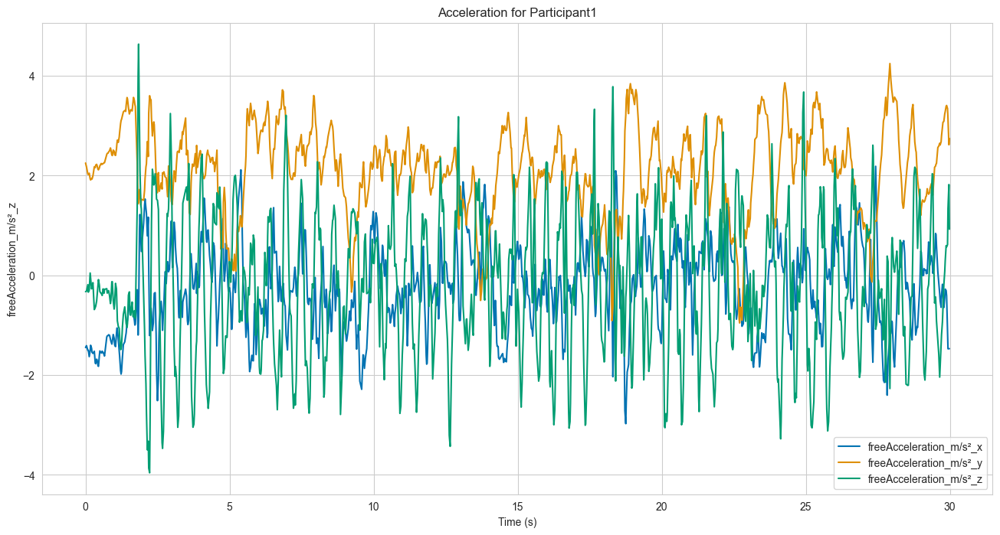

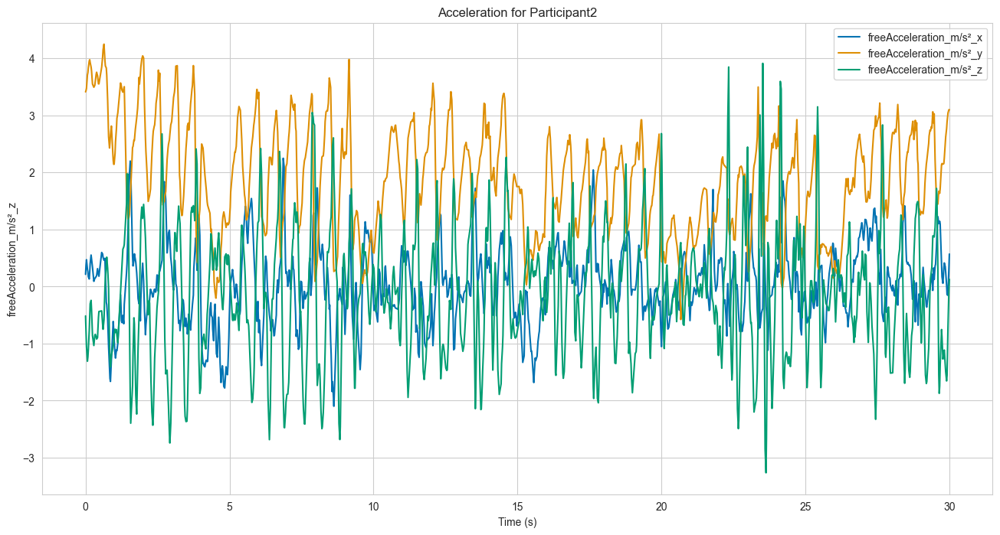

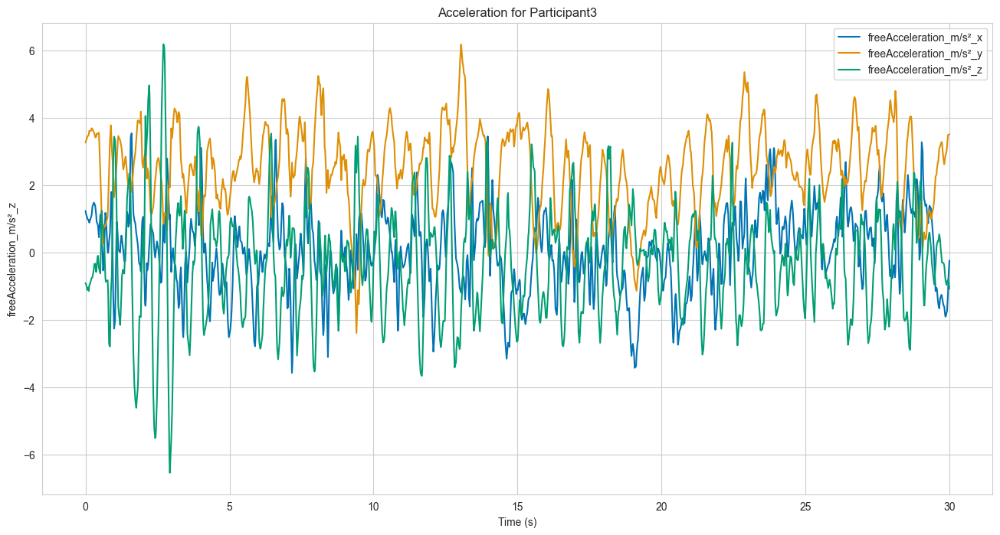

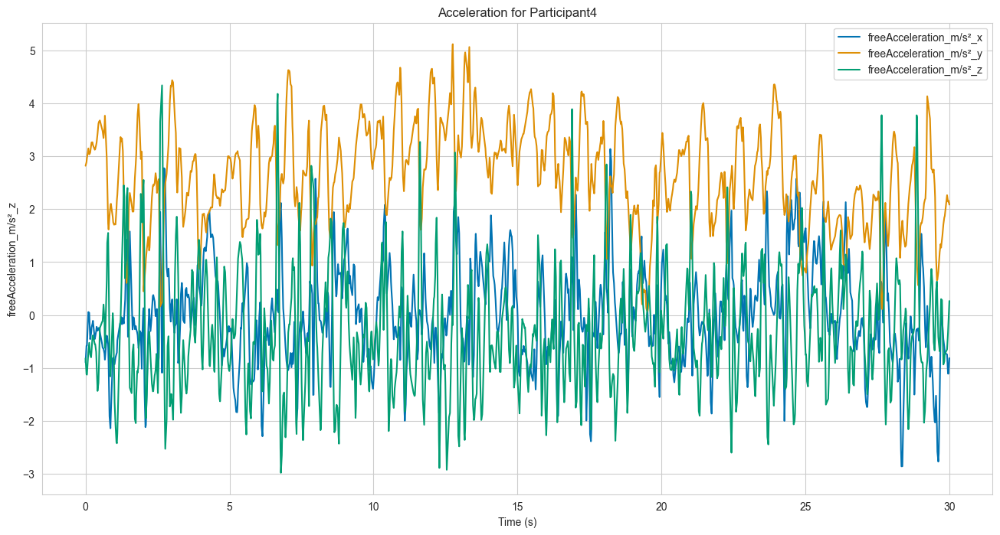

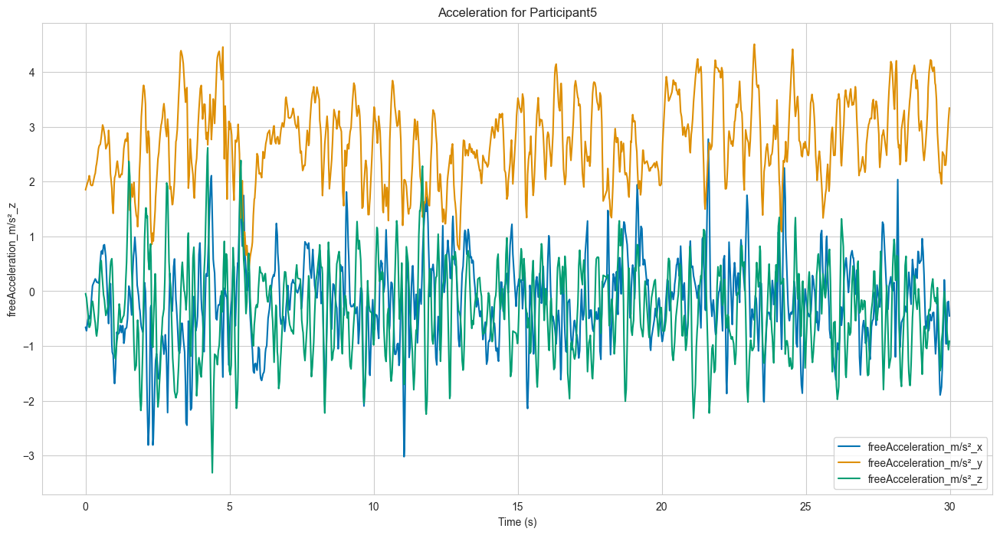

In [48]:
for i, dframe in enumerate(dfs_stand):
    plot_column(dframe, ['freeAcceleration_m/s²_x', 'freeAcceleration_m/s²_y', 'freeAcceleration_m/s²_z'])
    plt.title('Acceleration for Participant' + str(i+1))
    plt.show()

In [49]:
dfs_stand[0]

,timestamp_ms,freeAcceleration_m/s²_x,freeAcceleration_m/s²_y,freeAcceleration_m/s²_z,time_s,acceleration_magnitude,acc_detrended_x,acc_detrended_y,acc_detrended_z,acceleration_magnitude_detrended,velocity_z,velocity_x,velocity_y,velocity_magnitude,position_z,position_x,position_y
0,1746707114626,-1.446162,2.251646,-0.326048,0.000,2.695849,-0.950396,0.095819,-0.107580,0.961253,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1746707114658,-1.409074,2.175973,-0.318869,0.032,2.611901,-0.913737,0.020210,-0.100467,0.919466,-0.003329,-0.029826,0.001856,0.030069,-0.000053,-0.000477,0.000030
2,1746707114707,-1.507179,2.025823,-0.186367,0.081,2.531853,-1.012273,-0.129877,0.031970,1.021071,-0.005007,-0.077013,-0.000830,0.077180,-0.000257,-0.003095,0.000055
3,1746707114722,-1.503590,2.021038,-0.336217,0.096,2.541342,-1.009113,-0.134599,-0.117945,1.024860,-0.005652,-0.092174,-0.002814,0.092390,-0.000337,-0.004364,0.000028
4,1746707114754,-1.628914,2.047957,-0.294343,0.128,2.633273,-1.134867,-0.107616,-0.076136,1.142498,-0.008757,-0.126477,-0.006689,0.126957,-0.000568,-0.007862,-0.000125
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1105,1746707144514,-0.410668,3.405884,0.571560,29.888,3.477841,-0.390012,1.320273,0.717971,1.552647,-0.122328,0.259018,-0.150454,0.323560,-0.796191,3.508597,0.564708
1106,1746707144546,-1.106680,3.343671,0.616426,29.920,3.575592,-1.086454,1.258123,0.762772,1.828956,-0.098636,0.235394,-0.109200,0.277605,-0.799726,3.516507,0.560553
1107,1746707144562,-1.471885,3.140879,1.340852,29.936,3.718797,-1.452089,1.055395,1.487133,2.331091,-0.080637,0.215086,-0.090692,0.246960,-0.801160,3.520111,0.558954
1108,1746707144594,-1.470090,2.617748,1.820015,29.968,3.510872,-1.450724,0.532328,1.966231,2.500807,-0.025383,0.168641,-0.065288,0.182611,-0.802857,3.526251,0.556458


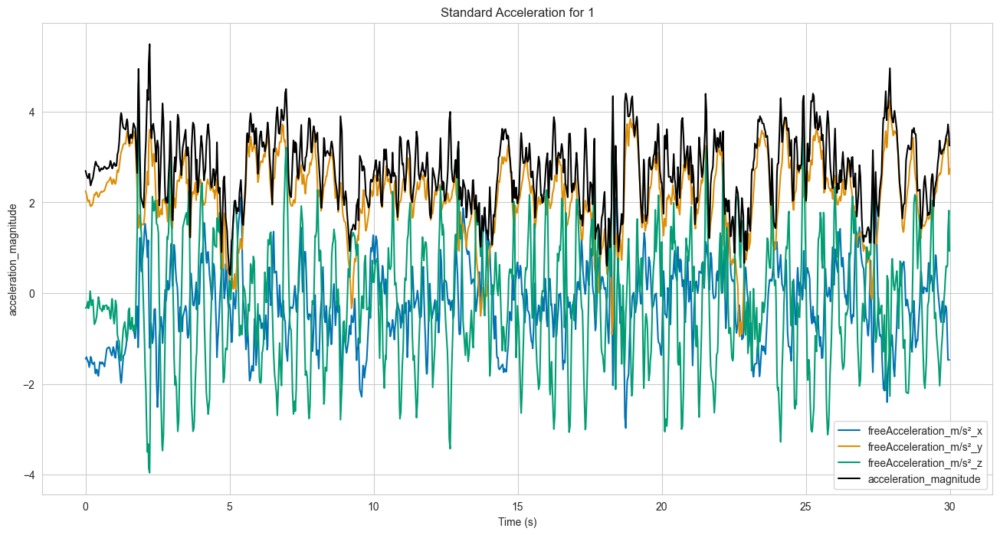

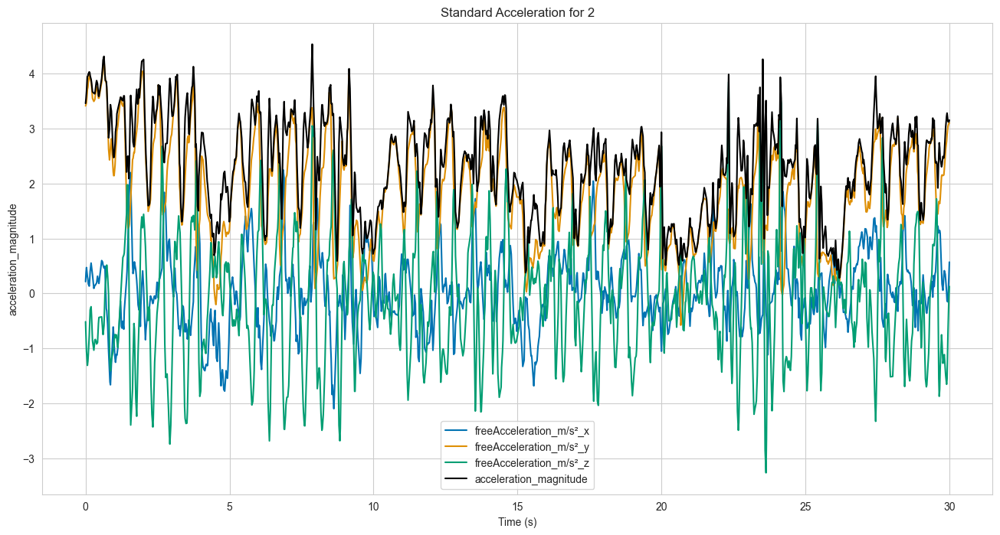

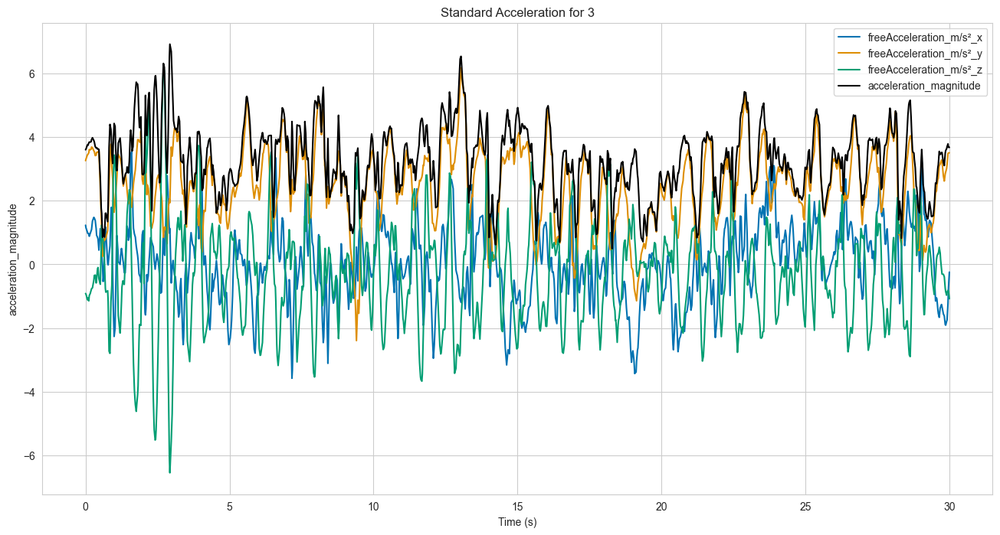

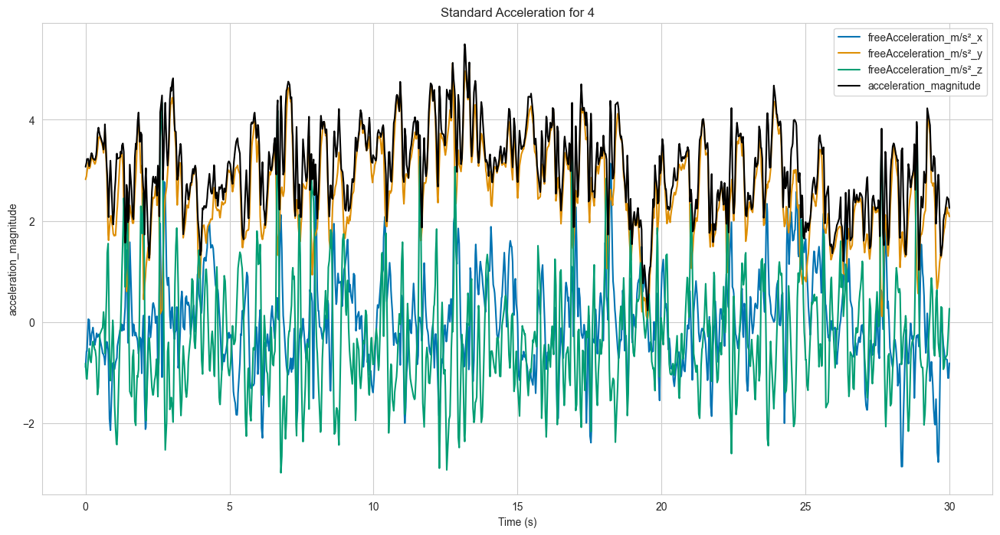

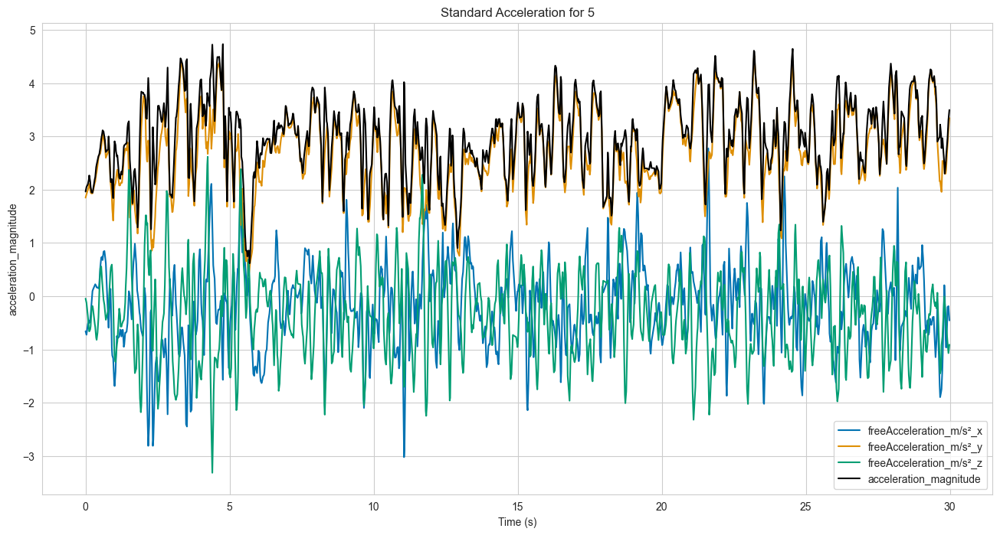

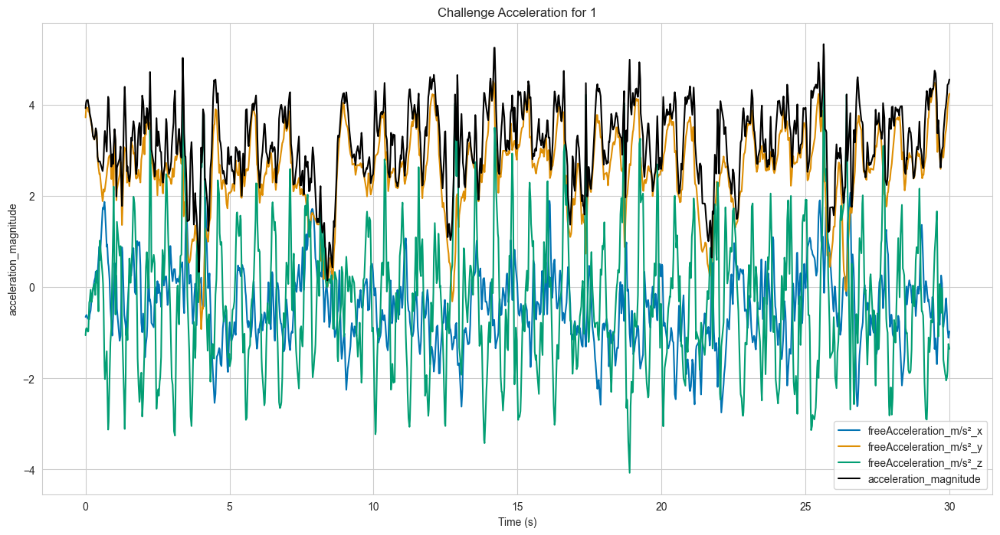

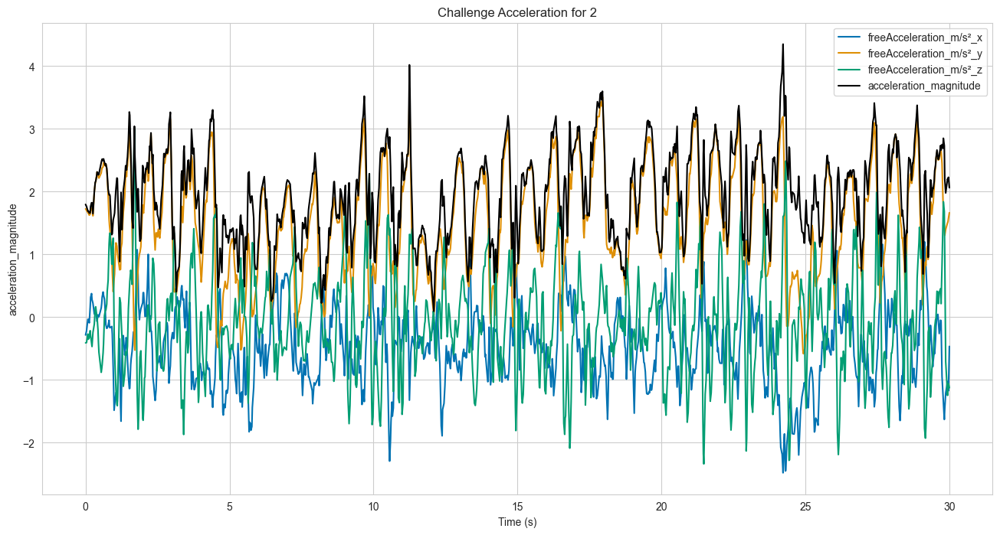

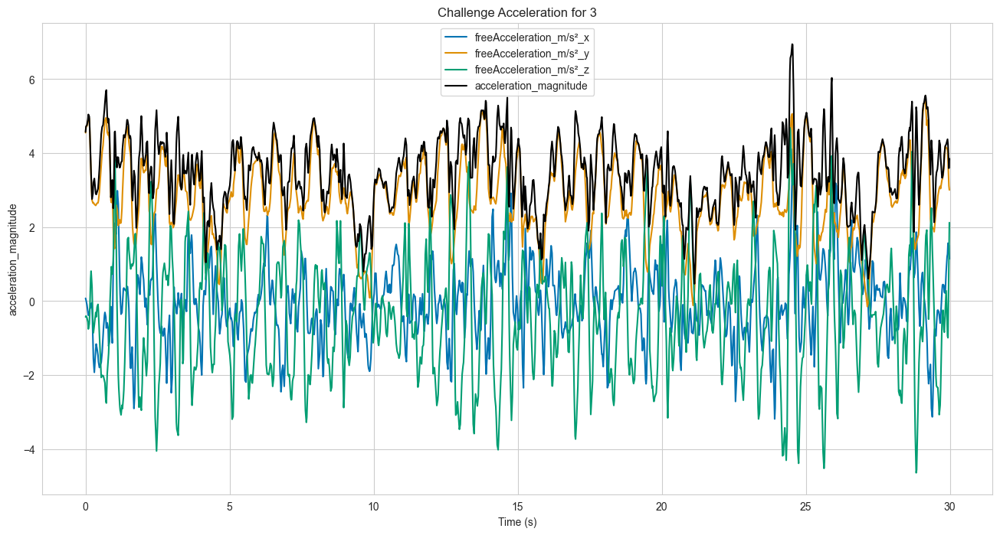

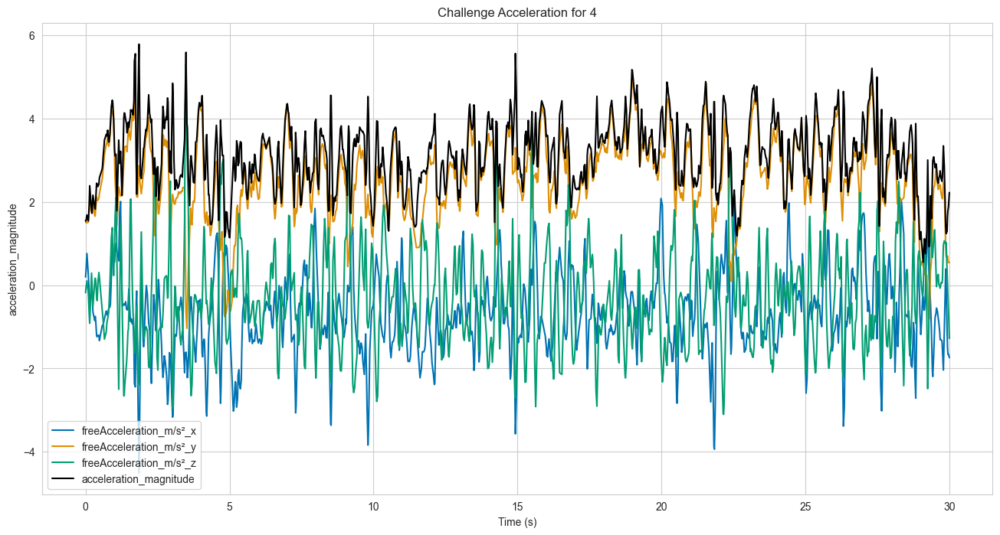

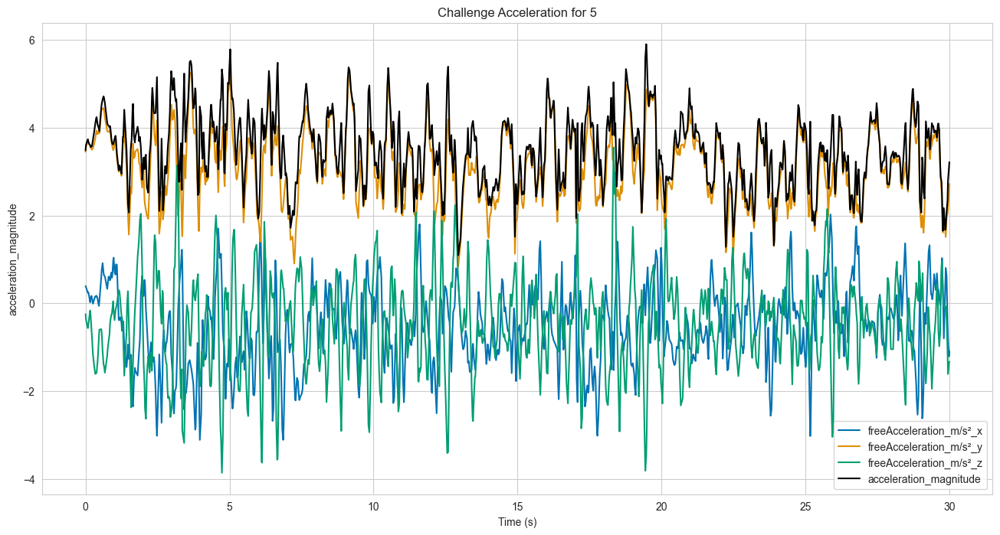

In [50]:
for i, dframe in enumerate(dfs_stand):
    plot_column(dframe, ['freeAcceleration_m/s²_x', 'freeAcceleration_m/s²_y', 'freeAcceleration_m/s²_z', 'acceleration_magnitude'])
    plt.title('Standard Acceleration for ' + str(i+1))
    plt.show()

for i, dframe in enumerate(dfs_stand_challenge):
    plot_column(dframe, ['freeAcceleration_m/s²_x', 'freeAcceleration_m/s²_y', 'freeAcceleration_m/s²_z', 'acceleration_magnitude'])
    plt.title('Challenge Acceleration for ' + str(i+1))

In [79]:
dfs_stand[0]

,timestamp_ms,freeAcceleration_m/s²_x,freeAcceleration_m/s²_y,freeAcceleration_m/s²_z,time_s,acceleration_magnitude,acc_detrended_x,acc_detrended_y,acc_detrended_z,acceleration_magnitude_detrended,velocity_z,velocity_x,velocity_y,velocity_magnitude,position_z,position_x,position_y
0,1746707114626,-1.446162,2.251646,-0.326048,0.000,2.695849,-0.950396,0.095819,-0.107580,0.961253,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1746707114658,-1.409074,2.175973,-0.318869,0.032,2.611901,-0.913737,0.020210,-0.100467,0.919466,-0.003329,-0.029826,0.001856,0.030069,-0.000053,-0.000477,0.000030
2,1746707114707,-1.507179,2.025823,-0.186367,0.081,2.531853,-1.012273,-0.129877,0.031970,1.021071,-0.005007,-0.077013,-0.000830,0.077180,-0.000257,-0.003095,0.000055
3,1746707114722,-1.503590,2.021038,-0.336217,0.096,2.541342,-1.009113,-0.134599,-0.117945,1.024860,-0.005652,-0.092174,-0.002814,0.092390,-0.000337,-0.004364,0.000028
4,1746707114754,-1.628914,2.047957,-0.294343,0.128,2.633273,-1.134867,-0.107616,-0.076136,1.142498,-0.008757,-0.126477,-0.006689,0.126957,-0.000568,-0.007862,-0.000125
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1105,1746707144514,-0.410668,3.405884,0.571560,29.888,3.477841,-0.390012,1.320273,0.717971,1.552647,-0.122328,0.259018,-0.150454,0.323560,-0.796191,3.508597,0.564708
1106,1746707144546,-1.106680,3.343671,0.616426,29.920,3.575592,-1.086454,1.258123,0.762772,1.828956,-0.098636,0.235394,-0.109200,0.277605,-0.799726,3.516507,0.560553
1107,1746707144562,-1.471885,3.140879,1.340852,29.936,3.718797,-1.452089,1.055395,1.487133,2.331091,-0.080637,0.215086,-0.090692,0.246960,-0.801160,3.520111,0.558954
1108,1746707144594,-1.470090,2.617748,1.820015,29.968,3.510872,-1.450724,0.532328,1.966231,2.500807,-0.025383,0.168641,-0.065288,0.182611,-0.802857,3.526251,0.556458


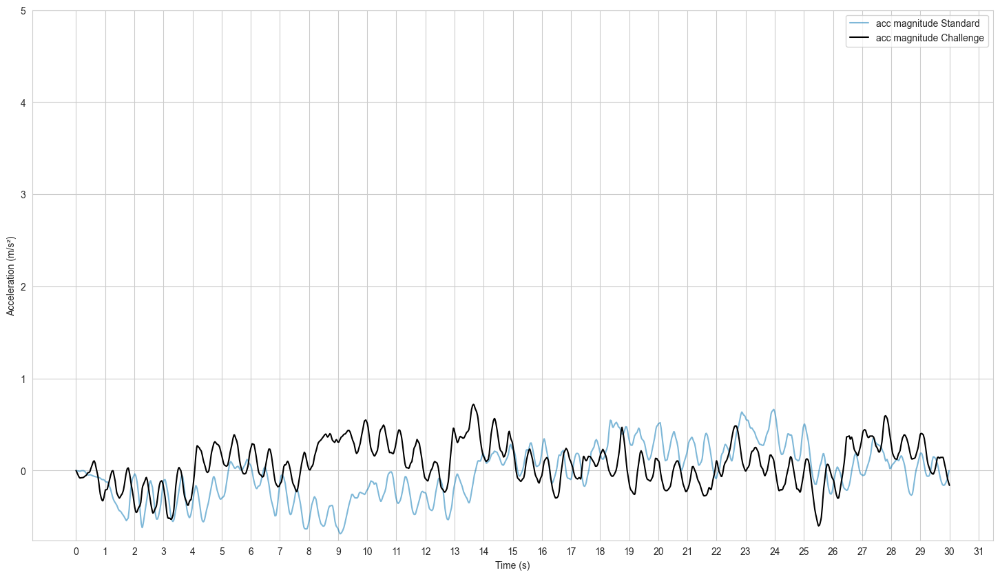

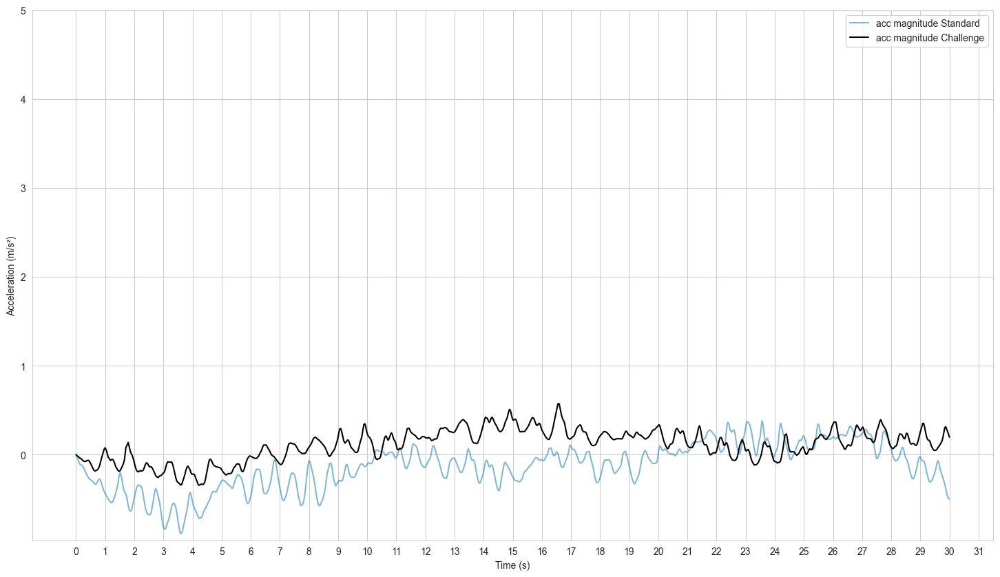

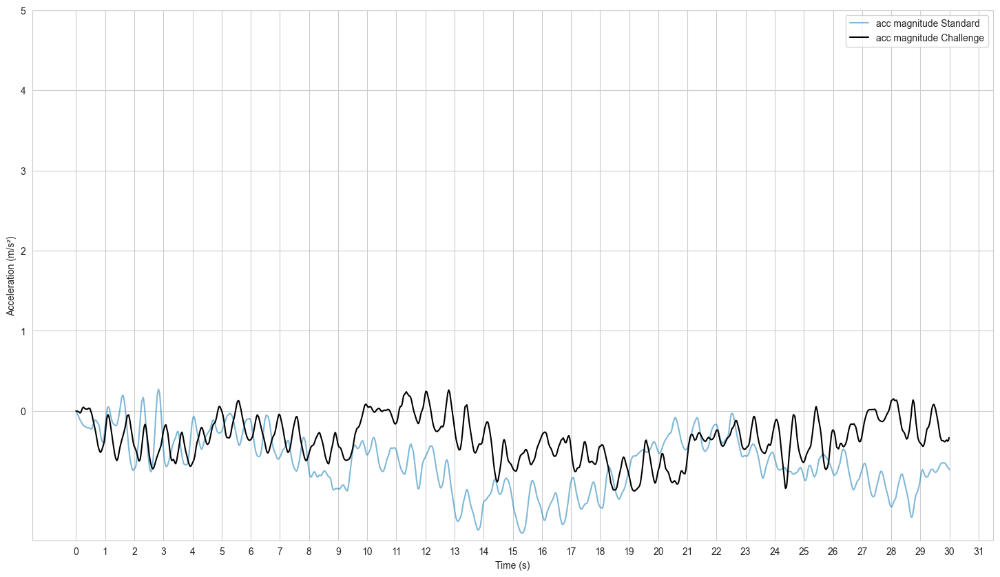

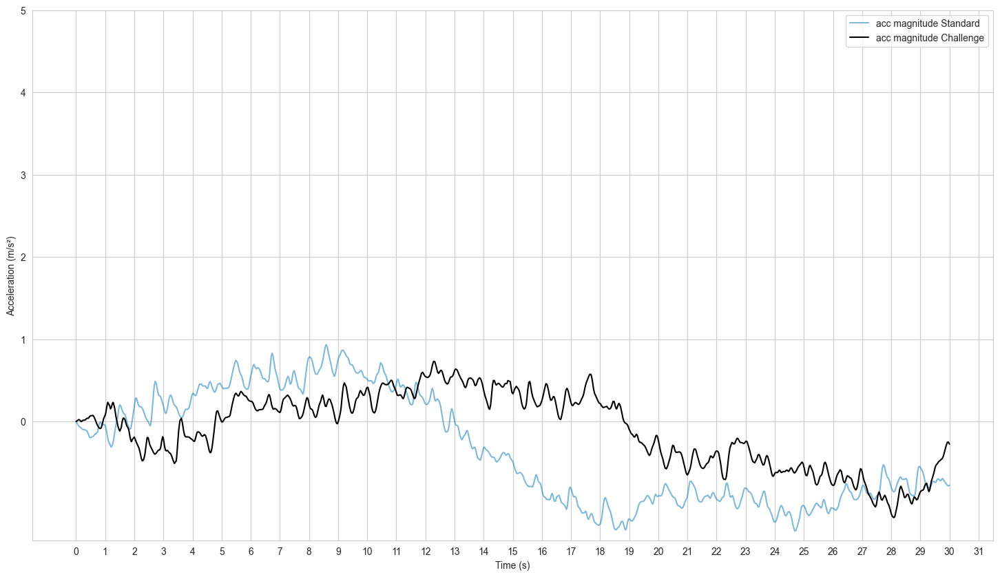

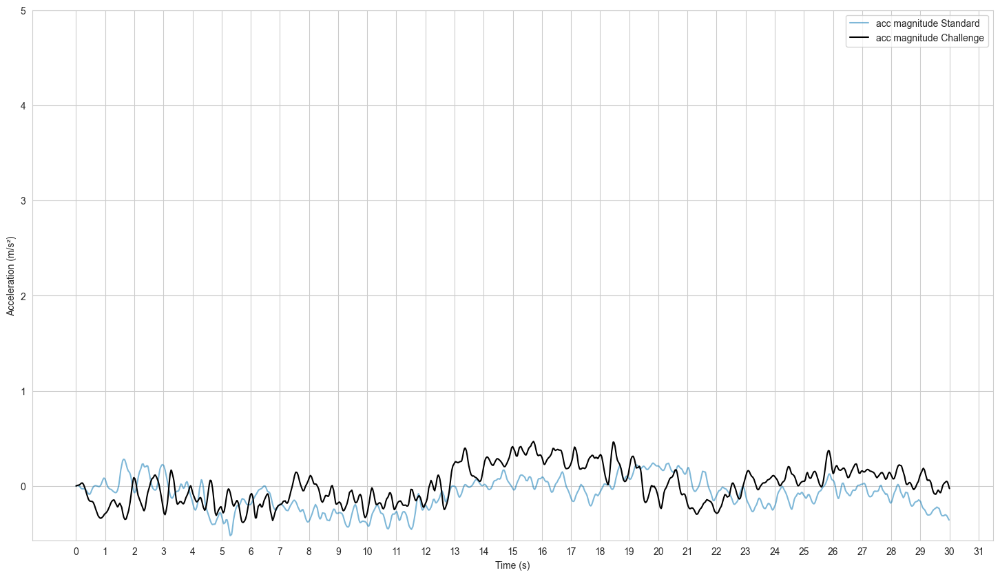

In [85]:
for i in range(len(dfs_stand)):
    df = dfs_stand[i]
    df_challenge = dfs_stand_challenge[i]

    sns.set_style('whitegrid')
    sns.set_palette('colorblind')

    # plot acceleration along x, y and z axis
    plt.figure(figsize=(18, 10))
    sns.lineplot(data=df, x='time_s', y='velocity_z', label='acc magnitude Standard', alpha=0.5)
    sns.lineplot(data=df_challenge, x='time_s', y='velocity_z', label='acc magnitude Challenge', color='black')

    plt.xticks(np.arange(0.0, 31.5, 1))
    plt.yticks(np.arange(0, 6, 1))

    # # draw a horizontal line at y=0
    # plt.axhline(y=0, color='black', linewidth=1)]


    plt.xlabel('Time (s)')
    plt.ylabel('Acceleration (m/s²)')

    # plt.title('Acceleration along x, y and z axis for Standard Sit to Stand task')
    # plt.tight_layout()
    plt.legend()


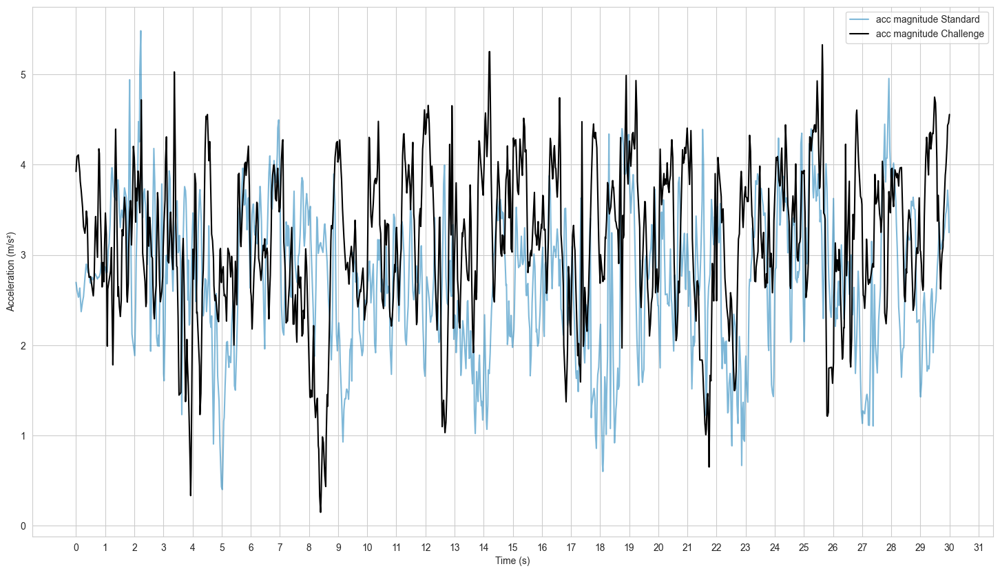

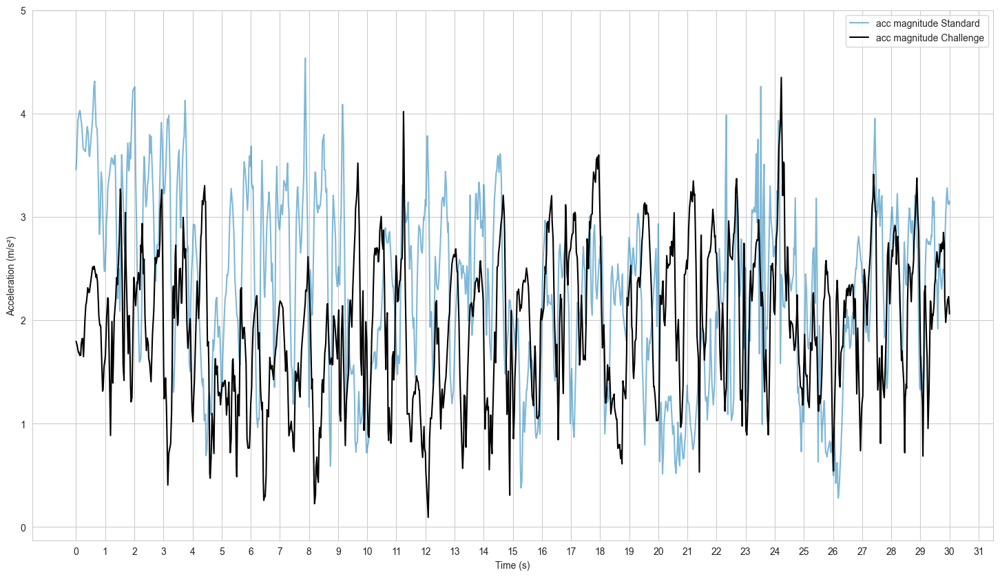

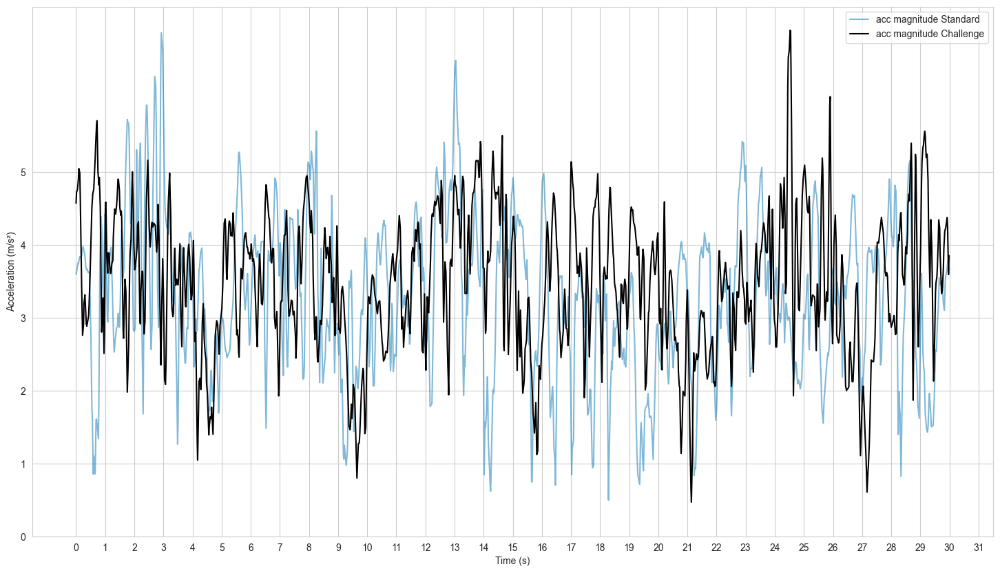

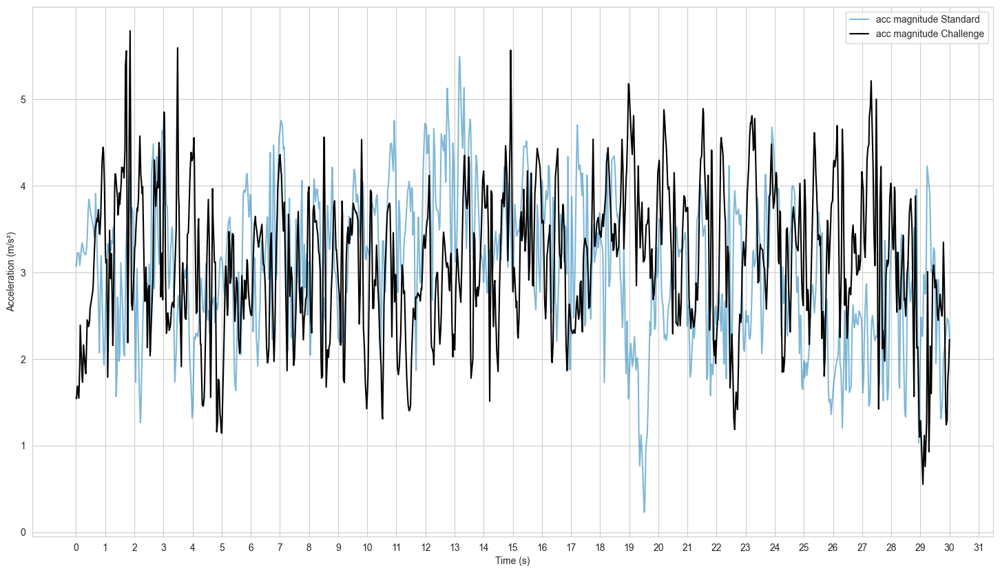

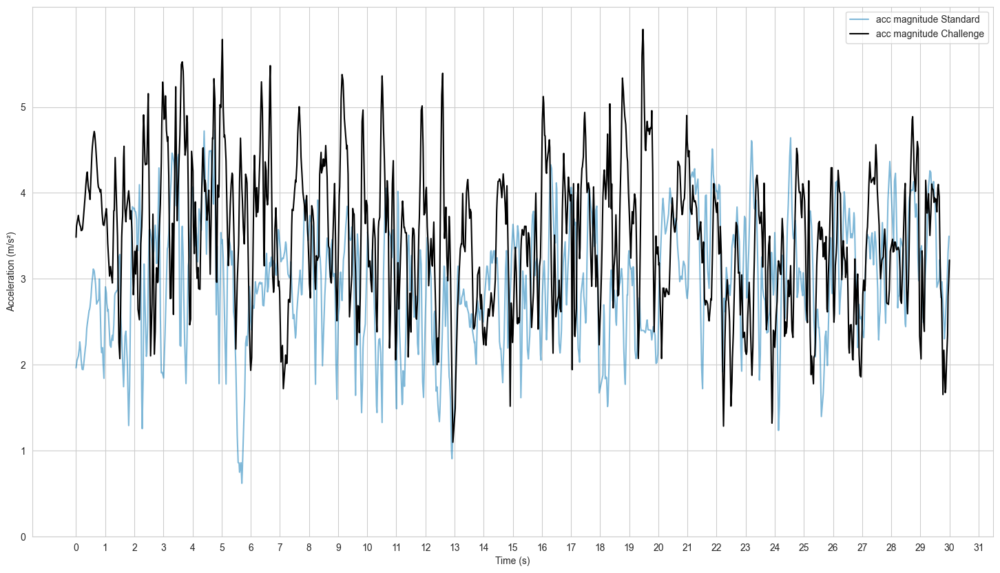

In [87]:
for i in range(len(dfs_stand)):
    df = dfs_stand[i]
    df_challenge = dfs_stand_challenge[i]

    sns.set_style('whitegrid')
    sns.set_palette('colorblind')

    # plot acceleration along x, y and z axis
    plt.figure(figsize=(18, 10))
    sns.lineplot(data=df, x='time_s', y='acceleration_magnitude', label='acc magnitude Standard', alpha=0.5)
    sns.lineplot(data=df_challenge, x='time_s', y='acceleration_magnitude', label='acc magnitude Challenge', color='black')

    plt.xticks(np.arange(0.0, 31.5, 1))
    plt.yticks(np.arange(0, 6, 1))

    # # draw a horizontal line at y=0
    # plt.axhline(y=0, color='black', linewidth=1)]


    plt.xlabel('Time (s)')
    plt.ylabel('Acceleration (m/s²)')

    # plt.title('Acceleration along x, y and z axis for Standard Sit to Stand task')
    # plt.tight_layout()
    plt.legend()


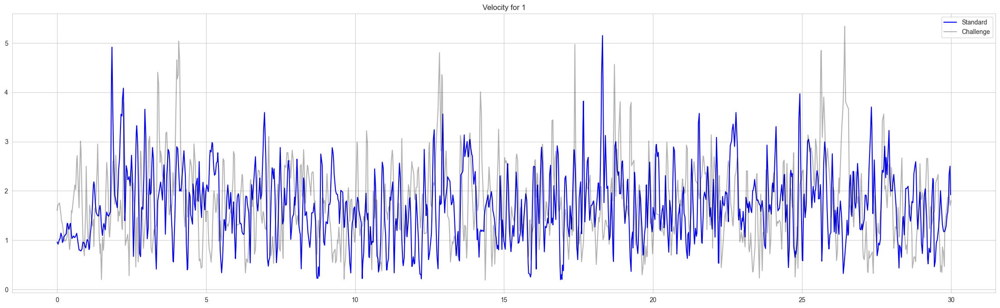

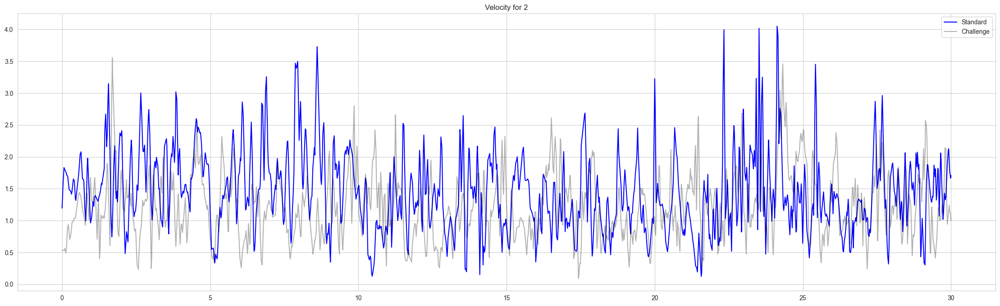

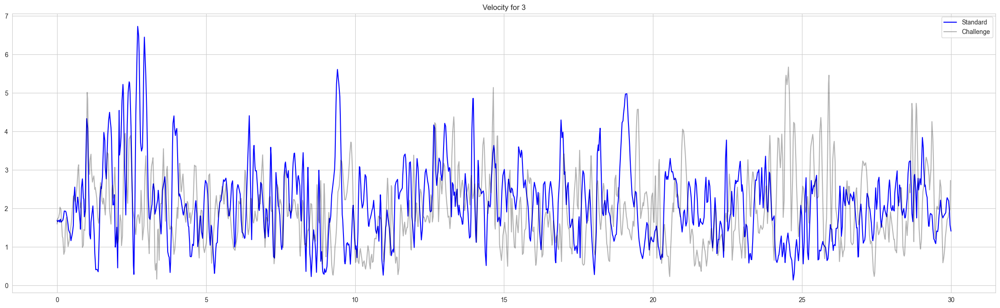

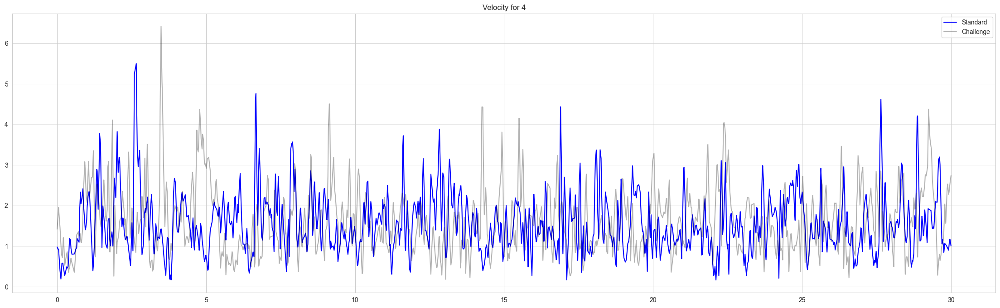

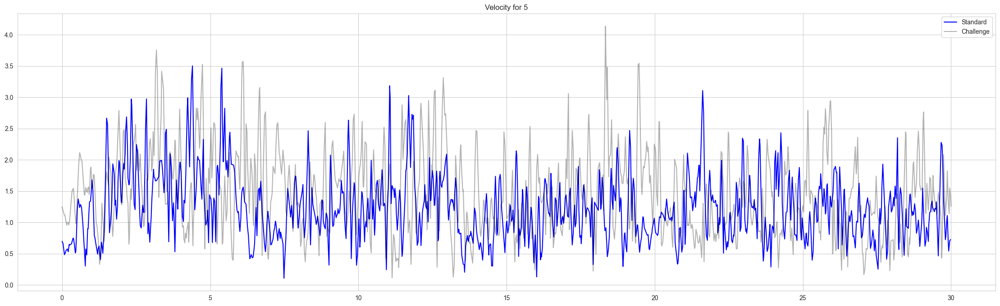

In [51]:
for i in range(len(dfs_stand)):
    # plot challenge and standard acceleration magnitude
    plt.figure(figsize=(28, 8))
    plt.plot(dfs_stand[i]['time_s'], dfs_stand[i]['acceleration_magnitude_detrended'], label='Standard', color='blue')
    plt.plot(dfs_stand_challenge[i]['time_s'], dfs_stand_challenge[i]['acceleration_magnitude_detrended'], label='Challenge', color='black', alpha=0.3)

    plt.title('Velocity for ' + str(i+1))
    plt.legend()
    plt.show()
    

In [52]:
dfs_stand[0]

,timestamp_ms,freeAcceleration_m/s²_x,freeAcceleration_m/s²_y,freeAcceleration_m/s²_z,time_s,acceleration_magnitude,acc_detrended_x,acc_detrended_y,acc_detrended_z,acceleration_magnitude_detrended,velocity_z,velocity_x,velocity_y,velocity_magnitude,position_z,position_x,position_y
0,1746707114626,-1.446162,2.251646,-0.326048,0.000,2.695849,-0.950396,0.095819,-0.107580,0.961253,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1746707114658,-1.409074,2.175973,-0.318869,0.032,2.611901,-0.913737,0.020210,-0.100467,0.919466,-0.003329,-0.029826,0.001856,0.030069,-0.000053,-0.000477,0.000030
2,1746707114707,-1.507179,2.025823,-0.186367,0.081,2.531853,-1.012273,-0.129877,0.031970,1.021071,-0.005007,-0.077013,-0.000830,0.077180,-0.000257,-0.003095,0.000055
3,1746707114722,-1.503590,2.021038,-0.336217,0.096,2.541342,-1.009113,-0.134599,-0.117945,1.024860,-0.005652,-0.092174,-0.002814,0.092390,-0.000337,-0.004364,0.000028
4,1746707114754,-1.628914,2.047957,-0.294343,0.128,2.633273,-1.134867,-0.107616,-0.076136,1.142498,-0.008757,-0.126477,-0.006689,0.126957,-0.000568,-0.007862,-0.000125
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1105,1746707144514,-0.410668,3.405884,0.571560,29.888,3.477841,-0.390012,1.320273,0.717971,1.552647,-0.122328,0.259018,-0.150454,0.323560,-0.796191,3.508597,0.564708
1106,1746707144546,-1.106680,3.343671,0.616426,29.920,3.575592,-1.086454,1.258123,0.762772,1.828956,-0.098636,0.235394,-0.109200,0.277605,-0.799726,3.516507,0.560553
1107,1746707144562,-1.471885,3.140879,1.340852,29.936,3.718797,-1.452089,1.055395,1.487133,2.331091,-0.080637,0.215086,-0.090692,0.246960,-0.801160,3.520111,0.558954
1108,1746707144594,-1.470090,2.617748,1.820015,29.968,3.510872,-1.450724,0.532328,1.966231,2.500807,-0.025383,0.168641,-0.065288,0.182611,-0.802857,3.526251,0.556458


In [53]:
dfs_stand_challenge[0]

,timestamp_ms,freeAcceleration_m/s²_x,freeAcceleration_m/s²_y,freeAcceleration_m/s²_z,time_s,acceleration_magnitude,acc_detrended_x,acc_detrended_y,acc_detrended_z,acceleration_magnitude_detrended,velocity_z,velocity_x,velocity_y,velocity_magnitude,position_z,position_x,position_y
0,1746707202738,-0.653839,3.723232,-1.055260,0.000,3.924734,-0.361252,1.339257,-0.806560,1.604572,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1746707202754,-0.627817,3.879364,-0.920365,0.016,4.036173,-0.334974,1.494999,-0.671589,1.672800,-0.011825,-0.005570,0.022674,0.026172,-0.000095,-0.000045,0.000181
2,1746707202771,-0.610469,3.945465,-0.898231,0.033,4.092211,-0.317369,1.560710,-0.649378,1.719951,-0.023053,-0.011115,0.048648,0.054969,-0.000391,-0.000186,0.000788
3,1746707202818,-0.692722,3.930510,-0.975699,0.080,4.108621,-0.399366,1.545364,-0.726769,1.753807,-0.055393,-0.027958,0.121640,0.136552,-0.002235,-0.001105,0.004789
4,1746707202834,-0.689432,3.851248,-0.968221,0.096,4.030494,-0.395820,1.465711,-0.719215,1.679956,-0.066961,-0.034320,0.145729,0.164008,-0.003213,-0.001603,0.006928
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1089,1746707232626,-0.243769,3.464807,-2.046487,29.888,4.031429,0.328073,0.655612,-1.714286,1.864466,-0.012247,-0.264569,-0.762490,0.807179,2.217496,-2.718142,-8.302519
1090,1746707232658,-0.632902,3.700201,-1.967823,29.920,4.238441,-0.060804,0.890616,-1.635545,1.863304,-0.065844,-0.260293,-0.737751,0.785088,2.216246,-2.726540,-8.326523
1091,1746707232674,-0.907179,3.932305,-1.841004,29.936,4.435684,-0.334825,1.122329,-1.508649,1.909909,-0.090998,-0.263458,-0.721647,0.773605,2.214992,-2.730730,-8.338198
1092,1746707232706,-1.110868,4.141078,-1.245789,29.968,4.464812,-0.538257,1.330712,-0.913358,1.701393,-0.129750,-0.277427,-0.682398,0.747976,2.211460,-2.739384,-8.360663


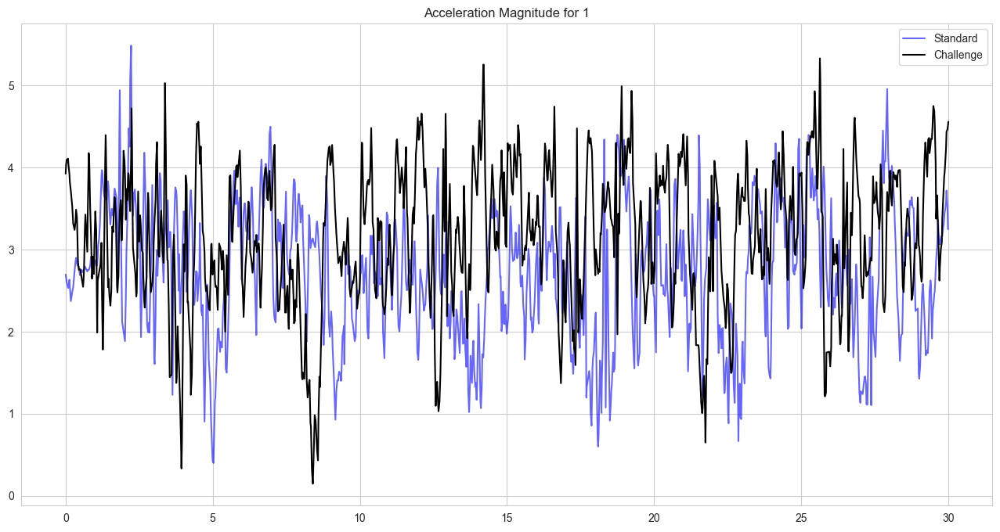

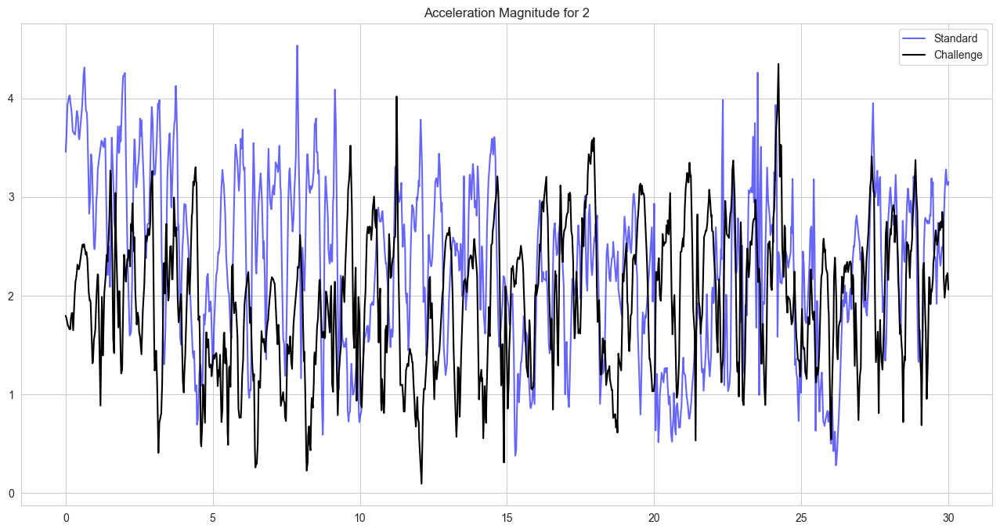

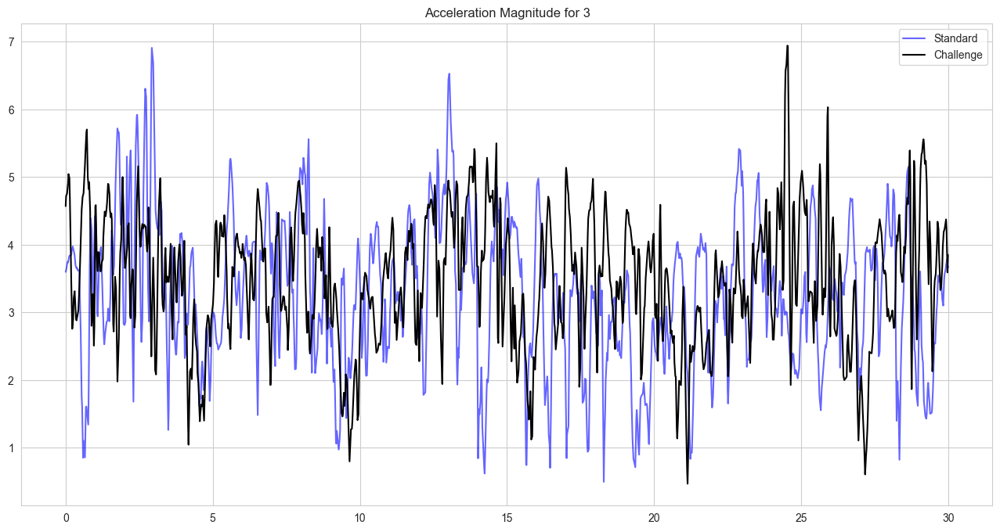

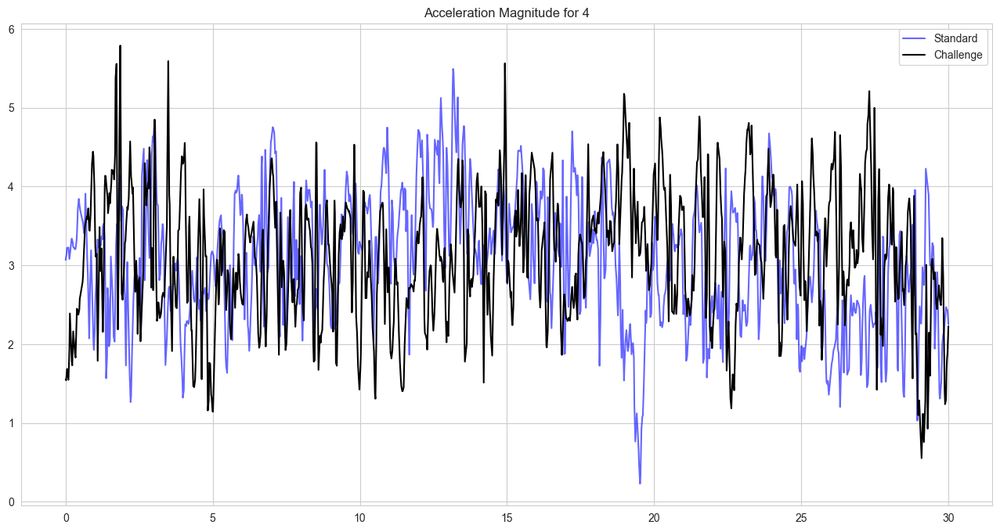

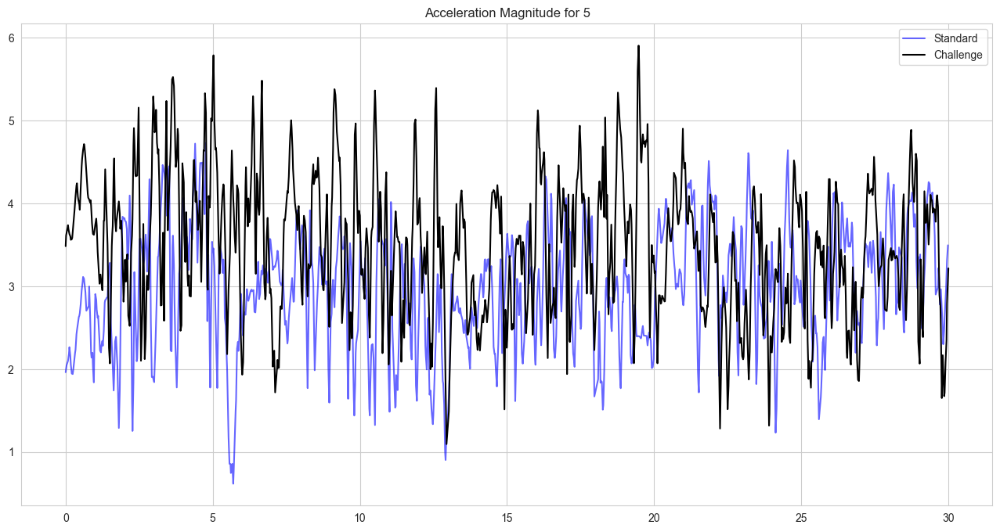

In [54]:
# Plot magnitude of acceleration for dfs_stand[0] and dfs_stand_challenge[0]

for item in range(len(dfs_stand)):
    column_name = 'freeAcceleration_m/s²_x'
    plt.figure(figsize=(16, 8))
    # plt.plot(dfs_stand[item]['time_s'], dfs_stand[item][column_name], label='Standard', color='blue', alpha=0.3)
    # plt.plot(dfs_stand_challenge[item]['time_s'], dfs_stand_challenge[item][column_name], label='Challenge', color='black')

    # plt.plot(dfs_stand[item]['time_s'], dfs_stand[item]['freeAcceleration_m/s²_y'], label='Standard', color='blue', alpha=0.3)
    # plt.plot(dfs_stand_challenge[item]['time_s'], dfs_stand_challenge[item]['freeAcceleration_m/s²_y'], label='Challenge', color='black')

    # plt.plot(dfs_stand[item]['time_s'], dfs_stand[item]['freeAcceleration_m/s²_z'], label='Standard', color='blue', alpha=0.3)
    # plt.plot(dfs_stand_challenge[item]['time_s'], dfs_stand_challenge[item]['freeAcceleration_m/s²_z'], label='Challenge', color='black')

    plt.plot(dfs_stand[item]['time_s'], dfs_stand[item]['acceleration_magnitude'], label='Standard', color='blue', alpha=0.6)
    plt.plot(dfs_stand_challenge[item]['time_s'], dfs_stand_challenge[item]['acceleration_magnitude'], label='Challenge', color='black',)
    plt.title('Acceleration Magnitude for ' + str(item+1))
    plt.legend()
    plt.show()

In [55]:
# Calculate the troughs and peaks of the velocity_z
from scipy.signal import find_peaks

def calculate_peaks_and_troughs(df, column_name):
    peaks, _ = find_peaks(df[column_name], distance=10, prominence=0.5)
    troughs, _ = find_peaks(-df[column_name], distance=10, prominence=0.5)
    return peaks, troughs

standard_peaks, standard_troughs = calculate_peaks_and_troughs(dfs_stand[0], 'acceleration_magnitude')
challenge_peaks, challenge_troughs = calculate_peaks_and_troughs(dfs_stand_challenge[0], 'acceleration_magnitude')

Participant 1 has 61 peaks and 51 troughs in standard


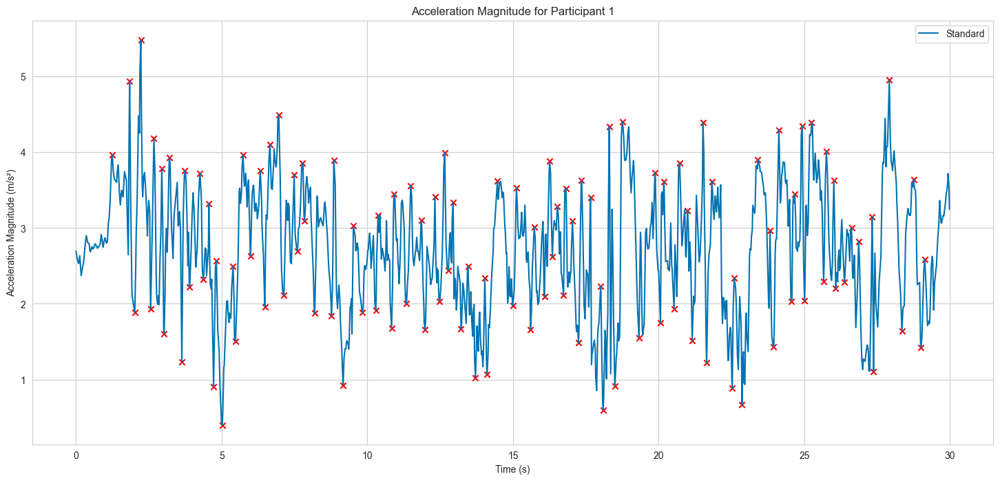

Participant 2 has 54 peaks and 52 troughs in standard


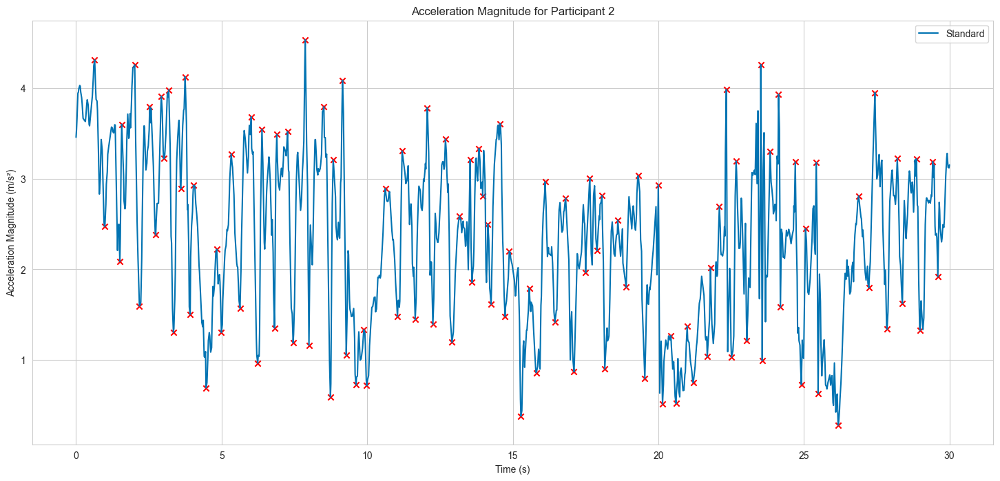

Participant 3 has 55 peaks and 59 troughs in standard


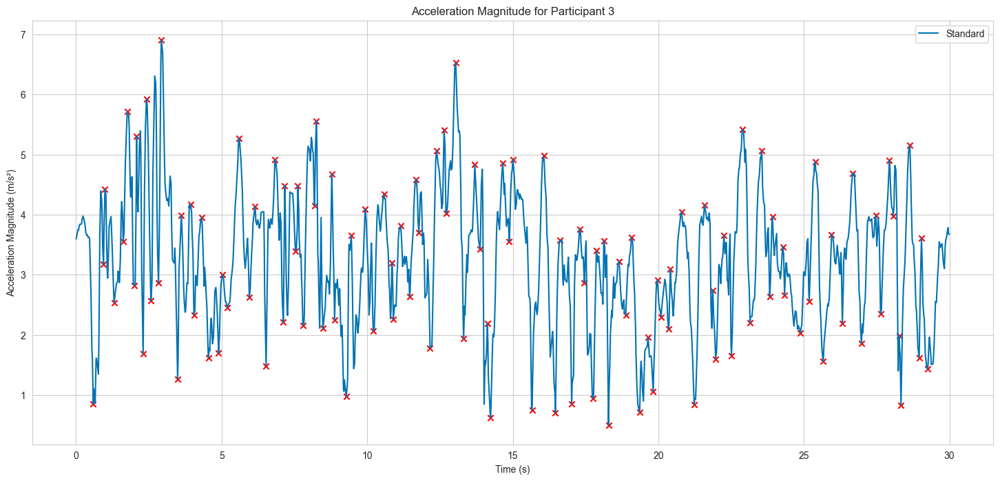

Participant 4 has 60 peaks and 49 troughs in standard


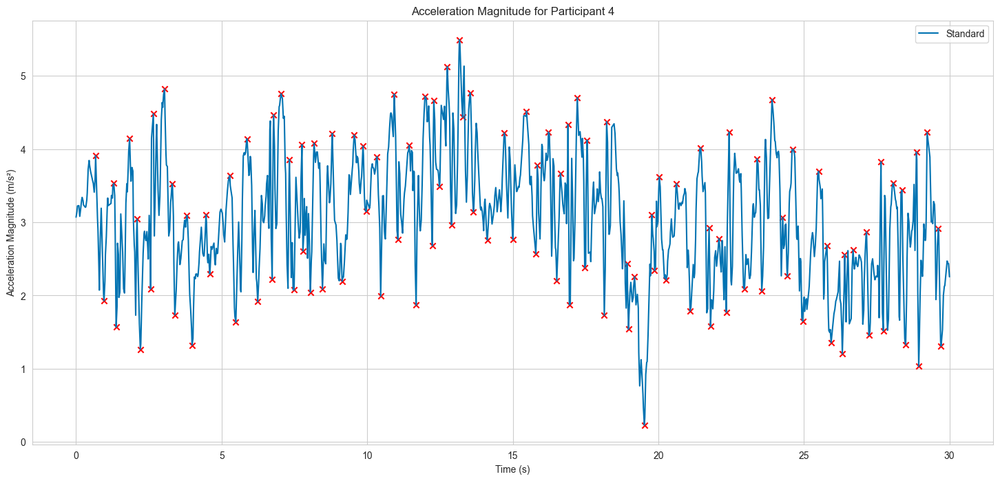

Participant 5 has 52 peaks and 48 troughs in standard


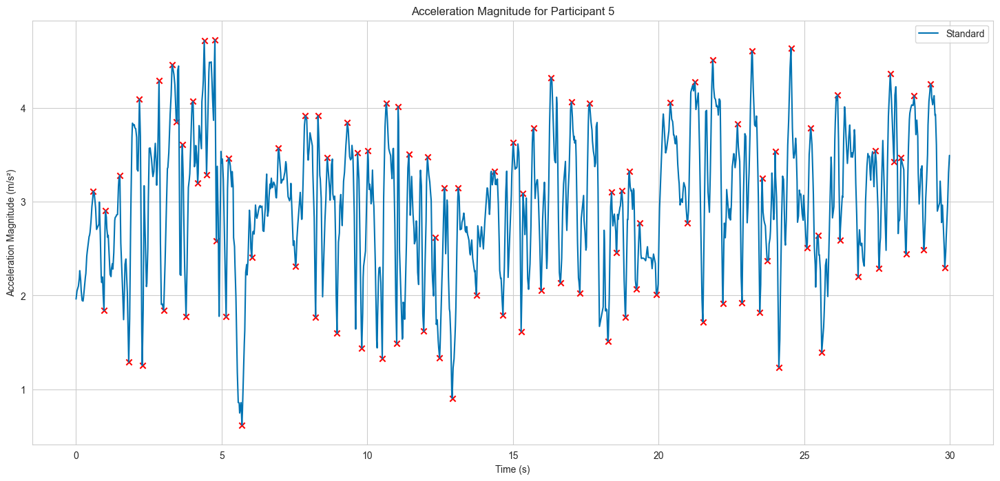

In [56]:
challenge = False
standard = True

counts_standard = []
counts_challenge = []
for i in range(len(dfs_stand)):
    # Plot the acceleration magnitude for each participant
    plt.figure(figsize=(18, 8))

    if standard:
        standard_peaks, standard_troughs = calculate_peaks_and_troughs(dfs_stand[i], 'acceleration_magnitude')
        plt.plot(dfs_stand[i]['time_s'], dfs_stand[i]['acceleration_magnitude'], label='Standard')
        plt.scatter(dfs_stand[i]['time_s'][standard_peaks], dfs_stand[i]['acceleration_magnitude'][standard_peaks], color='red', marker='x')
        plt.scatter(dfs_stand[i]['time_s'][standard_troughs], dfs_stand[i]['acceleration_magnitude'][standard_troughs], color='red', marker='x')
        print(f"Participant {i+1} has {len(standard_peaks)} peaks and {len(standard_troughs)} troughs in standard")
        counts_standard.append(len(standard_peaks))
    if challenge:
        challenge_peaks, challenge_troughs = calculate_peaks_and_troughs(dfs_stand_challenge[i], 'acceleration_magnitude')
        plt.plot(dfs_stand_challenge[i]['time_s'], dfs_stand_challenge[i]['acceleration_magnitude'], label='Challenge')
        plt.scatter(dfs_stand_challenge[i]['time_s'][challenge_peaks], dfs_stand_challenge[i]['acceleration_magnitude'][challenge_peaks], color='black', marker='x')
        plt.scatter(dfs_stand_challenge[i]['time_s'][challenge_troughs], dfs_stand_challenge[i]['acceleration_magnitude'][challenge_troughs], color='black', marker='x')
        print(f"Participant {i+1} has {len(challenge_peaks)} peaks and {len(challenge_troughs)} troughs in challenge")
        counts_challenge.append(len(challenge_peaks))

    plt.title('Acceleration Magnitude for Participant ' + str(i+1))

    plt.xlabel('Time (s)')
    plt.ylabel('Acceleration Magnitude (m/s²)')
    plt.legend()
    plt.show()



Participant 1 has 61 peaks and 51 troughs in standard


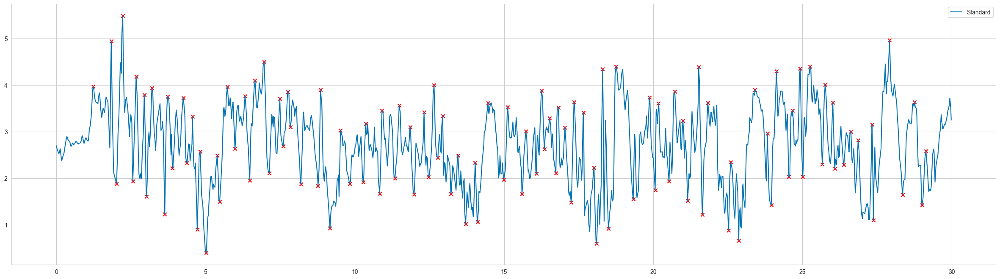

Participant 2 has 54 peaks and 52 troughs in standard


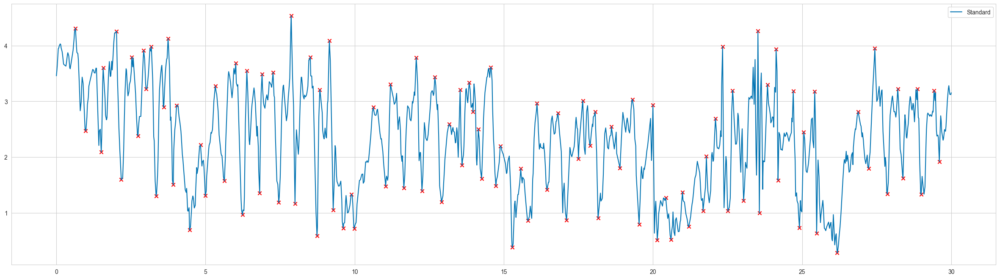

Participant 3 has 55 peaks and 59 troughs in standard


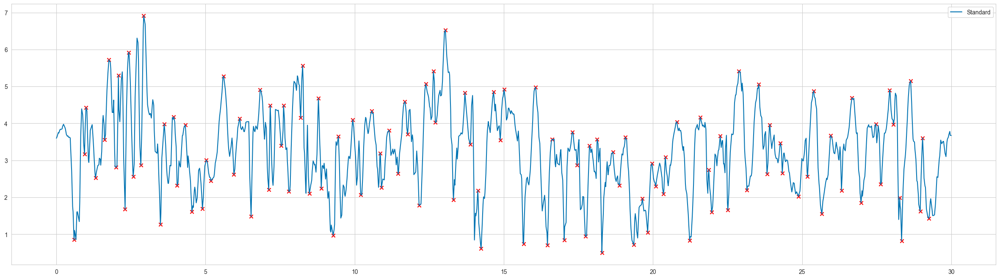

Participant 4 has 60 peaks and 49 troughs in standard


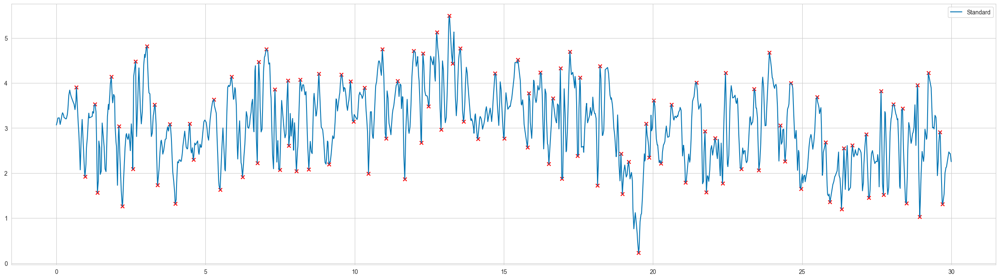

Participant 5 has 52 peaks and 48 troughs in standard


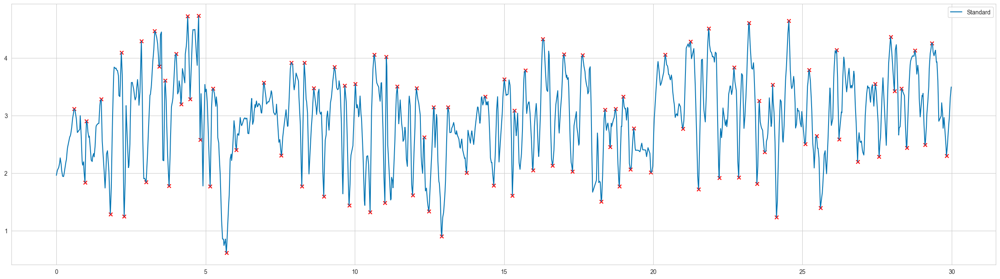

In [57]:
challenge = False
standard = True
for i in range(len(dfs_stand)):
    # Plot the acceleration magnitude for each participant
    plt.figure(figsize=(30, 8))

    if standard:
        standard_peaks, standard_troughs = calculate_peaks_and_troughs(dfs_stand[i], 'acceleration_magnitude')
        plt.plot(dfs_stand[i]['time_s'], dfs_stand[i]['acceleration_magnitude'], label='Standard')
        plt.scatter(dfs_stand[i]['time_s'][standard_peaks], dfs_stand[i]['acceleration_magnitude'][standard_peaks], color='red', marker='x')
        plt.scatter(dfs_stand[i]['time_s'][standard_troughs], dfs_stand[i]['acceleration_magnitude'][standard_troughs], color='red', marker='x')
        print(f"Participant {i+1} has {len(standard_peaks)} peaks and {len(standard_troughs)} troughs in standard")
    if challenge:
        challenge_peaks, challenge_troughs = calculate_peaks_and_troughs(dfs_stand_challenge[i], 'acceleration_magnitude')
        plt.plot(dfs_stand_challenge[i]['time_s'], dfs_stand_challenge[i]['acceleration_magnitude'], label='Challenge')
        plt.scatter(dfs_stand_challenge[i]['time_s'][challenge_peaks], dfs_stand_challenge[i]['acceleration_magnitude'][challenge_peaks], color='black', marker='x')
        plt.scatter(dfs_stand_challenge[i]['time_s'][challenge_troughs], dfs_stand_challenge[i]['acceleration_magnitude'][challenge_troughs], color='black', marker='x')
        print(f"Participant {i+1} has {len(challenge_peaks)} peaks and {len(challenge_troughs)} troughs in challenge")

    plt.legend()
    plt.show()



In [58]:
counts_standard = np.array(counts_standard)
counts_challenge = np.array(counts_challenge)

counts_standard, counts_challenge

(array([61, 54, 55, 60, 52]), array([], dtype=float64))

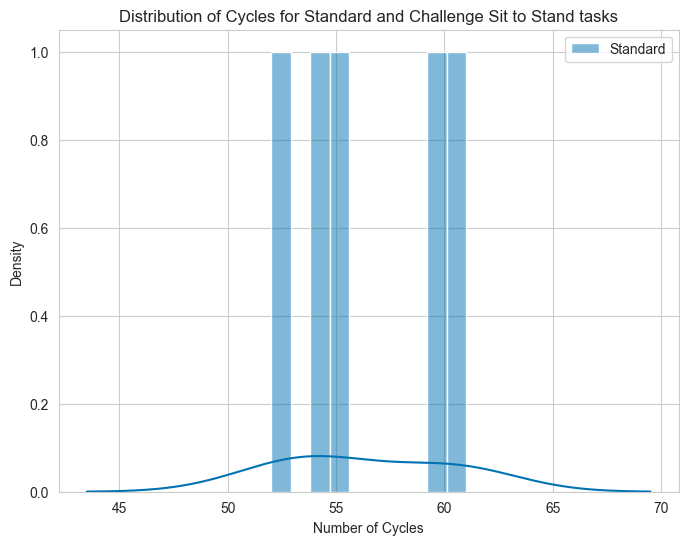

In [59]:
plt.figure(figsize=(8, 6))
sns.histplot(counts_standard, bins=10, alpha=0.5, label='Standard')
sns.histplot(counts_challenge, bins=10, alpha=0.5, label='Challenge')
# Plot a fit line
sns.kdeplot(counts_standard, )
sns.kdeplot(counts_challenge,)
plt.title('Distribution of Cycles for Standard and Challenge Sit to Stand tasks')
plt.xlabel('Number of Cycles')
plt.ylabel('Density')
plt.legend()
plt.show()

In [60]:
df_normal = pd.read_csv('/Users/ashish/Desktop/DS4W/sensorhub-analysis/xhoel_phone_hand/2025-05-22T14_04_31Z-step_count/Internal Accelerometer_accelerometer.csv')
df_challenge = pd.read_csv('/Users/ashish/Desktop/DS4W/sensorhub-analysis/xhoel_phone_hand/2025-05-22T14_30_27Z-step_count_challenge/Internal Accelerometer_accelerometer.csv')
df_normal

,timestamp_ms,acceleration_m/s²_x,acceleration_m/s²_y,acceleration_m/s²_z
0,1747922671476,7.735397,-5.127520,2.526821
1,1747922671491,7.743773,-5.161019,2.499004
2,1747922671508,7.429415,-5.030611,2.366203
3,1747922671540,7.865507,-5.449355,2.496611
4,1747922671572,7.739286,-5.284549,2.337189
...,...,...,...,...
1024,1747922699715,-2.050948,3.269792,8.990433
1025,1747922699731,-2.023132,3.275774,8.886943
1026,1747922699763,-2.239383,3.373282,8.701500
1027,1747922699844,-2.255235,3.464807,9.659526


In [61]:
df_challenge


,timestamp_ms,acceleration_m/s²_x,acceleration_m/s²_y,acceleration_m/s²_z
0,1747924227428,1.513460,2.309971,9.970593
1,1747924227443,1.570888,2.343172,9.620643
2,1747924227460,1.663610,2.354538,9.330513
3,1747924227492,1.702493,2.417648,9.929018
4,1747924227507,1.665704,2.399702,9.780065
...,...,...,...,...
1462,1747924266995,1.068395,2.042872,9.594321
1463,1747924267011,1.088734,2.032404,9.608080
1464,1747924267044,0.962214,1.942673,9.684950
1465,1747924267076,1.646262,1.407578,10.577473


In [62]:
# rename columns
df_challenge.rename(columns={'acceleration_m/s²_x': 'freeAcceleration_m/s²_x', 'acceleration_m/s²_y': 'freeAcceleration_m/s²_y', 'acceleration_m/s²_z': 'freeAcceleration_m/s²_z'}, inplace=True)

df_normal.rename(columns={'acceleration_m/s²_x': 'freeAcceleration_m/s²_x', 'acceleration_m/s²_y': 'freeAcceleration_m/s²_y', 'acceleration_m/s²_z': 'freeAcceleration_m/s²_z'}, inplace=True)

df_normal 

,timestamp_ms,freeAcceleration_m/s²_x,freeAcceleration_m/s²_y,freeAcceleration_m/s²_z
0,1747922671476,7.735397,-5.127520,2.526821
1,1747922671491,7.743773,-5.161019,2.499004
2,1747922671508,7.429415,-5.030611,2.366203
3,1747922671540,7.865507,-5.449355,2.496611
4,1747922671572,7.739286,-5.284549,2.337189
...,...,...,...,...
1024,1747922699715,-2.050948,3.269792,8.990433
1025,1747922699731,-2.023132,3.275774,8.886943
1026,1747922699763,-2.239383,3.373282,8.701500
1027,1747922699844,-2.255235,3.464807,9.659526


In [63]:
df_normal

,timestamp_ms,freeAcceleration_m/s²_x,freeAcceleration_m/s²_y,freeAcceleration_m/s²_z
0,1747922671476,7.735397,-5.127520,2.526821
1,1747922671491,7.743773,-5.161019,2.499004
2,1747922671508,7.429415,-5.030611,2.366203
3,1747922671540,7.865507,-5.449355,2.496611
4,1747922671572,7.739286,-5.284549,2.337189
...,...,...,...,...
1024,1747922699715,-2.050948,3.269792,8.990433
1025,1747922699731,-2.023132,3.275774,8.886943
1026,1747922699763,-2.239383,3.373282,8.701500
1027,1747922699844,-2.255235,3.464807,9.659526


In [64]:
df_challenge

,timestamp_ms,freeAcceleration_m/s²_x,freeAcceleration_m/s²_y,freeAcceleration_m/s²_z
0,1747924227428,1.513460,2.309971,9.970593
1,1747924227443,1.570888,2.343172,9.620643
2,1747924227460,1.663610,2.354538,9.330513
3,1747924227492,1.702493,2.417648,9.929018
4,1747924227507,1.665704,2.399702,9.780065
...,...,...,...,...
1462,1747924266995,1.068395,2.042872,9.594321
1463,1747924267011,1.088734,2.032404,9.608080
1464,1747924267044,0.962214,1.942673,9.684950
1465,1747924267076,1.646262,1.407578,10.577473


In [65]:
df_normal = preprocess_data(df_normal)
df_challenge = preprocess_data(df_challenge)

/var/folders/zp/3681gr8x5mg9vt0z3xbtlzx00000gn/T/ipykernel_33421/1017378032.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['freeAcceleration_m/s²_z'] = df['freeAcceleration_m/s²_z'] - 9.81
/var/folders/zp/3681gr8x5mg9vt0z3xbtlzx00000gn/T/ipykernel_33421/1017378032.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['acceleration_magnitude'] = np.sqrt(
/var/folders/zp/3681gr8x5mg9vt0z3xbtlzx00000gn/T/ipykernel_33421/1017378032.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy

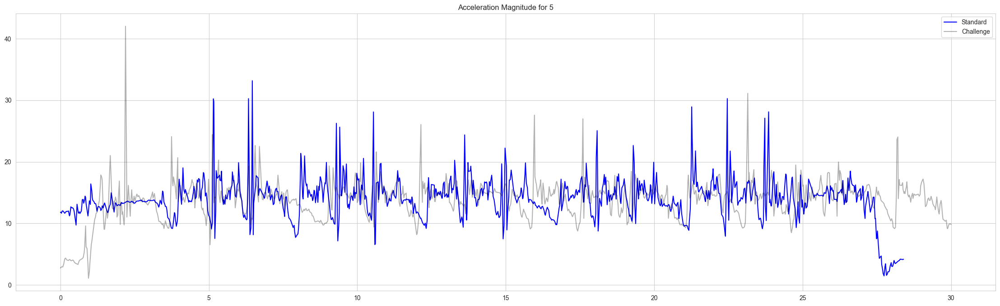

In [66]:
# plot challenge and standard acceleration magnitude
plt.figure(figsize=(28, 8))
plt.plot(df_normal['time_s'], df_normal['acceleration_magnitude'], label='Standard', color='blue')
plt.plot(df_challenge['time_s'], df_challenge['acceleration_magnitude'], label='Challenge', color='black', alpha=0.3)
plt.title('Acceleration Magnitude for ' + str(i+1))
plt.legend()
plt.show()


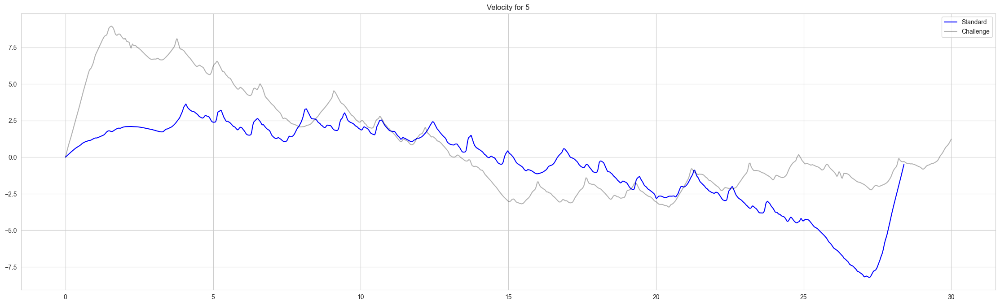

In [67]:
# plot challenge and standard acceleration magnitude
plt.figure(figsize=(28, 8))
plt.plot(df_normal['time_s'], df_normal['velocity_z'], label='Standard', color='blue')
plt.plot(df_challenge['time_s'], df_challenge['velocity_z'], label='Challenge', color='black', alpha=0.3)
plt.title('Velocity for ' + str(i+1))
plt.legend()
plt.show()

In [68]:

min_ts = dfs_stand[2].timestamp_ms.min() / 1000

(dfs_stand[2].iloc[35:40].timestamp_ms / 1000) - min_ts
# get 10th row of dfs_stand[0]






35    0.960
36    0.992
37    1.025
38    1.040
39    1.073
Name: timestamp_ms, dtype: float64

In [69]:
30*30

900

[1110, 1087, 1123, 1086, 1076]
[1094, 1095, 1132, 1101, 1084]


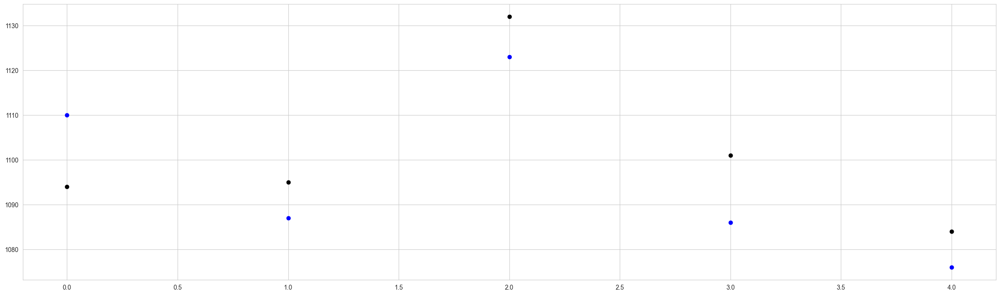

In [70]:
len_std = [len(dfs_stand[i]) for i in range(len(dfs_stand))]
len_challenge = [len(dfs_stand_challenge[i]) for i in range(len(dfs_stand_challenge))]

plt.figure(figsize=(28, 8))
plt.scatter(range(len(len_std)), len_std, label='Standard', color='blue')
plt.scatter(range(len(len_challenge)), len_challenge, label='Challenge', color='black')
# also  the values of len_std and len_challenge
print(len_std)
print(len_challenge)


ValueError: x and y must have same first dimension, but have shapes (1110,) and (1094,)

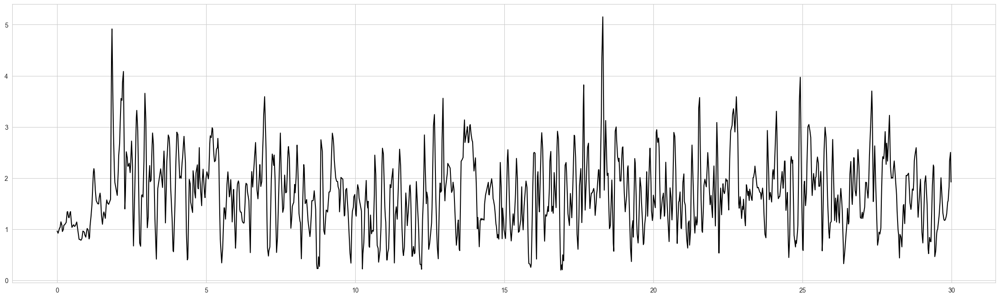

In [71]:
# plot displacement
df = dfs_stand[0]
for i, df in enumerate(dfs_stand):
    plt.figure(figsize=(28, 8))
    plt.plot(df['time_s'], df['acceleration_magnitude_detrended'], label='Standard', color='black')
    plt.plot(df['time_s'], dfs_stand_challenge[i]['velocity_magnitude'], label='Challenge', color='red')
    plt.title('Displacement for ' + str(i+1))
    plt.legend()
    plt.show()
